In [41]:
from IPython.display import Image, display

# Display the image
image_url = "https://www.ercot.com/files/assets/2023/04/26/Weather.jpg"
display(Image(url=image_url))

# Load the yearly ERCOT hourly load data (2025 is till end of February)

In [7]:
import pandas as pd
import glob
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

# Path to the directory containing the .xlsx files
path = 'load-data/*.xlsx'

# Get a list of all .xlsx files in the directory
all_files = glob.glob(path)

# Create an empty list to store the DataFrames
dfs = []

for file in all_files:
    df = pd.read_excel(file)
    
    # Combine 'HourEnding' and 'Hour Ending' into a single 'TIME' column
    if 'HourEnding' in df.columns and 'Hour Ending' in df.columns:
        df['TIME'] = df['HourEnding'].combine_first(df['Hour Ending'])
    elif 'HourEnding' in df.columns:
        df['TIME'] = df['HourEnding']
    elif 'Hour Ending' in df.columns:
        df['TIME'] = df['Hour Ending']
    
    # Drop the original columns
    df = df.drop(columns=['HourEnding', 'Hour Ending'], errors='ignore')
    
    dfs.append(df)

# Concatenate all the DataFrames into a single DataFrame
df = pd.concat(dfs, ignore_index=True)

# Display the combined DataFrame
df

,COAST,EAST,FWEST,NORTH,NCENT,SOUTH,SCENT,WEST,ERCOT,TIME
0,11425.979115,1852.663959,2823.409245,1135.360907,18584.343617,3831.649454,9151.190703,1762.472684,50567.069682,01/01/2018 01:00
1,11408.418023,1850.169452,2809.745403,1136.630855,18524.141392,3988.271046,9144.993712,1754.718094,50617.087977,01/01/2018 02:00
2,11405.198365,1858.269586,2797.802576,1135.930264,18532.056616,4076.086451,9141.036615,1747.919615,50694.300087,01/01/2018 03:00
3,11450.560138,1879.623596,2807.793880,1146.069491,18647.444612,4154.939804,9157.956866,1755.203307,50999.591693,01/01/2018 04:00
4,11631.337459,1876.481320,2822.989206,1154.186967,19002.102222,4247.451523,9214.333628,1774.849690,51723.732017,01/01/2018 05:00
...,...,...,...,...,...,...,...,...,...,...
62779,12289.742410,1501.370812,7027.478214,1414.692447,12569.901268,3947.643796,7510.979019,1150.660258,47412.468224,02/28/2025 20:00
62780,12089.500362,1480.264262,7097.979335,1431.445778,12383.934355,3804.225323,7342.852199,1130.135315,46760.336929,02/28/2025 21:00
62781,11940.877875,1460.269123,7142.270350,1437.538915,12127.386883,3742.182544,7103.414392,1112.107979,46066.048061,02/28/2025 22:00
62782,11556.222543,1382.366295,7079.711434,1390.959677,11548.852838,3653.597969,6761.647003,1100.167564,44473.525322,02/28/2025 23:00


# Filter data to look at max load per calendar day

In [8]:
import pandas as pd
load = df.copy()

# First remove " DST" suffixes, if present, and handle "24:00"
load['TIME'] = load['TIME'].str.replace(' DST', '', regex=False)
load['TIME'] = load['TIME'].str.replace('24:00', '00:00')

# Convert TIME to datetime
load['TIME'] = pd.to_datetime(load['TIME'], format='%m/%d/%Y %H:%M')

# Shift dates forward by one day if originally '24:00'
midnight_mask = load['TIME'].dt.hour == 0
load.loc[midnight_mask, 'TIME'] += pd.Timedelta(days=1)

# Create DATE column
load['DATE'] = load['TIME'].dt.date

# Group and aggregate max values by day
daily_load = load.groupby('DATE')[['COAST', 'EAST', 'FWEST', 'NORTH',
                                   'NCENT', 'SOUTH', 'SCENT', 'WEST',
                                   'ERCOT']].max().reset_index()

daily_load


,DATE,COAST,EAST,FWEST,NORTH,NCENT,SOUTH,SCENT,WEST,ERCOT
0,2018-01-01,13662.919186,2027.695331,2900.219041,1244.104924,20338.611561,5484.945603,10332.284210,1932.575706,57297.399445
1,2018-01-02,15655.352391,2274.207068,3072.446620,1303.390357,22168.940606,6093.725044,9616.555198,1949.397263,61948.679437
2,2018-01-03,15424.463286,2311.384249,2931.941621,1297.635776,22017.339622,5610.300484,11343.263979,1964.425855,62889.972501
3,2018-01-04,14482.313506,2169.900489,2796.548527,1170.144954,19569.618815,5469.231630,9744.511630,1760.875338,57163.144890
4,2018-01-05,12337.913465,1951.273039,2799.462845,1118.509047,17602.195958,4118.118380,7616.031101,1511.488008,49054.991843
...,...,...,...,...,...,...,...,...,...,...
2612,2025-02-25,12713.253803,1872.163896,7337.693588,1615.795556,13606.130084,4060.042292,7965.795703,1289.768526,49729.937201
2613,2025-02-26,13415.917253,1626.989346,7224.602471,1478.469874,14271.030058,4215.359355,8265.711659,1205.861153,50991.441587
2614,2025-02-27,12672.208361,1597.186487,7369.346233,1580.993886,13073.283287,3896.465807,7670.648950,1212.484048,47992.521232
2615,2025-02-28,12896.925206,1835.070821,7485.169485,1601.876160,14446.554246,3992.567400,7743.152655,1312.113696,49530.304455


# Load the historical observatiosn from the CWG database for specific station observations

In [9]:
path = '../observations/*.csv'

all_files = glob.glob(path)

# Create an empty list to store the DataFrames
dfs = []

for file in all_files:
    df = pd.read_csv(file)
    dfs.append(df)

stations = pd.concat(dfs, ignore_index=True)

# Display the combined DataFrame
stations['AvgTemp'] = (stations['MinTemp'] + stations['MaxTemp']) / 2
stations['TotalDD'] = stations['CDD'] + stations['HDD']
stations

,date,station,MinTemp,MaxTemp,HDD,CDD,AvgTemp,TotalDD
0,2009-07-09,KABR,62,83,0,8,72.5,8
1,2009-07-09,KABI,80,106,0,28,93.0,28
2,2009-07-09,KALB,55,76,0,0,65.5,0
3,2009-07-09,KABQ,69,94,0,16,81.5,16
4,2009-07-09,KABE,53,78,0,0,65.5,0
...,...,...,...,...,...,...,...,...
2236486,2025-03-20,KHBG,39,68,12,0,53.5,12
2236487,2025-03-20,CYXU,28,60,21,0,44.0,21
2236488,2025-03-20,KLMT,23,45,31,0,34.0,31
2236489,2025-03-20,KWWR,25,63,21,0,44.0,21


# Create weightings for major load centers within regions. This is done with population weightings

In [10]:
# COAST	EAST	FWEST	NORTH	NCENT	SOUTH	SCENT	WEST	ERCOT

# stations and weights
ERCOT = {'KDFW':0.35, 'KIAH':0.34, 'KSAT':0.12, 'KAUS':0.11, 'KBRO':0.06, 'KCRP': 0.02}

COAST={'KIAH':0.91, 'KGLS':0.07, 'KVCT':0.02}

EAST = {'KTYR':0.75, 'KLFK':0.25}

FWEST = {'KMAF':0.90, 'KFST':0.10}

NORTH = {'KSPS':0.3, 'KLBB':0.7}

NCENT = {'KDFW':1.0}

SOUTH =  {'KBRO': 0.37, 'KCRP': 0.28, 'KLRD': 0.23, 'KMFE': 0.12}

SCENT = {'KSAT': 0.52, 'KAUS': 0.46, 'KCLL': 0.02}

WEST = {'KABI':0.8, 'KDRT':0.1, 'KJCT':0.1}

# Combine the records

In [11]:
import pandas as pd

# Ensure DATE columns are datetime
daily_load['DATE'] = pd.to_datetime(daily_load['DATE'])
stations['date'] = pd.to_datetime(stations['date'])

# Metrics to aggregate
metrics = ['MinTemp', 'MaxTemp', 'HDD', 'CDD', 'AvgTemp', 'TotalDD']

# Mapping of regions to weights
region_weights = {
    'ERCOT': ERCOT,
    'COAST': COAST,
    'EAST': EAST,
    'FWEST': FWEST,
    'NORTH': NORTH,
    'NCENT': NCENT,
    'SOUTH': SOUTH,
    'SCENT': SCENT,
    'WEST': WEST
}

# Initialize the combined DataFrame
combined_df = daily_load.copy()

# Calculate weighted averages per region and date
for metric in metrics:
    for region, weights in region_weights.items():
        # Extract relevant stations
        region_stations = stations[stations['station'].isin(weights.keys())]

        # Compute weighted averages per day
        weighted_avg = (
            region_stations
            .assign(weight=region_stations['station'].map(weights))
            .groupby('date')
            .apply(lambda x: (x[metric] * x['weight']).sum() / x['weight'].sum())
            .rename(f'{region}_{metric}')
            .reset_index()
        )

        # Merge into combined_df
        combined_df = combined_df.merge(
            weighted_avg, left_on='DATE', right_on='date', how='left'
        ).drop(columns='date')

# Display result
combined_df


,DATE,COAST,EAST,FWEST,NORTH,NCENT,SOUTH,SCENT,WEST,ERCOT,...,WEST_AvgTemp,ERCOT_TotalDD,COAST_TotalDD,EAST_TotalDD,FWEST_TotalDD,NORTH_TotalDD,NCENT_TotalDD,SOUTH_TotalDD,SCENT_TotalDD,WEST_TotalDD
0,2018-01-01,13662.919186,2027.695331,2900.219041,1244.104924,20338.611561,5484.945603,10332.284210,1932.575706,57297.399445,...,17.90,35.21,29.72,38.25,48.0,50.8,42.0,26.32,36.42,47.1
1,2018-01-02,15655.352391,2274.207068,3072.446620,1303.390357,22168.940606,6093.725044,9616.555198,1949.397263,61948.679437,...,20.90,36.10,33.82,40.25,42.0,46.0,40.0,29.48,35.88,44.2
2,2018-01-03,15424.463286,2311.384249,2931.941621,1297.635776,22017.339622,5610.300484,11343.263979,1964.425855,62889.972501,...,33.10,28.28,27.97,32.75,30.0,31.9,30.0,23.11,27.92,31.9
3,2018-01-04,14482.313506,2169.900489,2796.548527,1170.144954,19569.618815,5469.231630,9744.511630,1760.875338,57163.144890,...,41.45,24.25,23.84,29.00,26.0,28.6,26.0,18.09,24.36,24.0
4,2018-01-05,12337.913465,1951.273039,2799.462845,1118.509047,17602.195958,4118.118380,7616.031101,1511.488008,49054.991843,...,46.45,16.83,18.64,22.00,22.0,28.5,18.0,8.42,15.42,18.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2612,2025-02-25,12713.253803,1872.163896,7337.693588,1615.795556,13606.130084,4060.042292,7965.795703,1289.768526,49729.937201,...,64.75,3.80,3.37,4.50,2.0,5.0,4.0,3.82,5.30,1.4
2613,2025-02-26,13415.917253,1626.989346,7224.602471,1478.469874,14271.030058,4215.359355,8265.711659,1205.861153,50991.441587,...,66.00,3.65,1.93,2.75,4.0,9.1,4.0,6.56,5.00,1.5
2614,2025-02-27,12672.208361,1597.186487,7369.346233,1580.993886,13073.283287,3896.465807,7670.648950,1212.484048,47992.521232,...,56.90,3.33,1.07,5.50,11.0,11.1,5.0,5.25,3.34,8.7
2615,2025-02-28,12896.925206,1835.070821,7485.169485,1601.876160,14446.554246,3992.567400,7743.152655,1312.113696,49530.304455,...,57.45,4.58,2.09,8.00,11.0,9.5,7.0,3.77,4.90,8.0


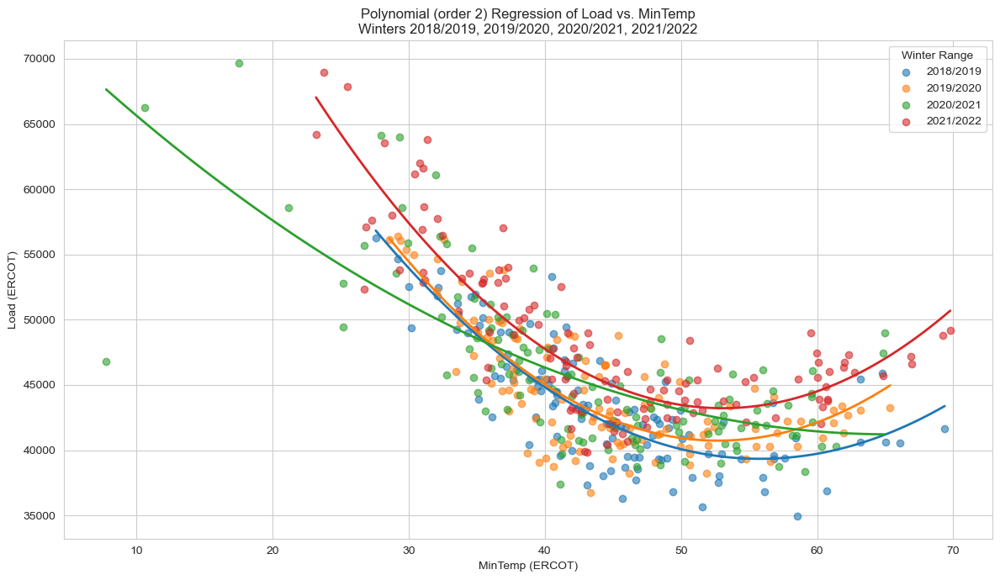

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_load_vs_weather_winter(
    df,
    winters,
    target_region,
    target_variable,
    polynomial_order=2
):
    """
    Plots scatter + polynomial regression of target_region's load vs. 
    target_region's target_variable for specified 'winter' seasons.

    :param df: DataFrame with columns:
               - 'DATE' (datetime),
               - region load columns (e.g. 'COAST', 'EAST', etc.),
               - region weather columns (e.g. 'COAST_MinTemp', etc.),
               - 'YEAR' (int) and 'MONTH' (int) can be added or assumed to exist
    :param winters: list of strings denoting winter ranges in "YYYY/YYYY" format,
                    e.g. ["2018/2019", "2019/2020"].  
                    - "2018/2019" means Nov & Dec 2018 plus Jan & Feb 2019.
    :param target_region: string, e.g. "COAST", "NORTH", etc.
    :param target_variable: string, e.g. "MinTemp", "MaxTemp", "HDD", "CDD", etc.
    :param polynomial_order: order of polynomial fit (int, e.g. 2).
    """

    # Ensure YEAR and MONTH columns exist
    if 'YEAR' not in df.columns or 'MONTH' not in df.columns:
        df['YEAR'] = df['DATE'].dt.year
        df['MONTH'] = df['DATE'].dt.month

    # Column names for x (weather) and y (load)
    weather_col = f'{target_region}_{target_variable}'
    load_col = target_region

    # Set up the figure
    sns.set_style("whitegrid")
    plt.figure(figsize=(12, 7))

    # Distinguish each winter by color
    palette = sns.color_palette('tab10', n_colors=len(winters))

    for i, winter_str in enumerate(winters):
        # Parse the "YYYY/YYYY" format
        start_year_str, next_year_str = winter_str.split('/')
        start_year = int(start_year_str)
        end_year = int(next_year_str)

        # Filter the DataFrame for Nov/Dec of start_year and Jan/Feb of end_year
        mask = (
            ((df['YEAR'] == start_year) & (df['MONTH'].isin([11, 12]))) |
            ((df['YEAR'] == end_year) & (df['MONTH'].isin([1, 2])))
        )
        winter_df = df[mask].dropna(subset=[weather_col, load_col])

        if winter_df.empty:
            print(f"No data for winter {winter_str}.")
            continue

        # Scatter plot
        plt.scatter(
            winter_df[weather_col],
            winter_df[load_col],
            alpha=0.6,
            color=palette[i],
            label=winter_str
        )

        # Polynomial regression
        z = np.polyfit(winter_df[weather_col], winter_df[load_col], polynomial_order)
        p = np.poly1d(z)

        # Plot regression line
        x_range = np.linspace(winter_df[weather_col].min(), winter_df[weather_col].max(), 100)
        plt.plot(x_range, p(x_range), color=palette[i], linewidth=2)

    # Labels and title
    plt.xlabel(f'{target_variable} ({target_region})')
    plt.ylabel(f'Load ({target_region})')
    plt.title(f'Polynomial (order {polynomial_order}) Regression of Load vs. {target_variable}\nWinters {", ".join(winters)}')
    plt.legend(title='Winter Range')
    plt.tight_layout()
    plt.show()



# Example usage:
# Plot load vs. minimum temperature for COAST, comparing two winters:
plot_load_vs_weather_winter(
    df=combined_df,
    winters=["2018/2019", "2019/2020", "2020/2021","2021/2022"],
    target_region="ERCOT",
    target_variable="MinTemp",
    polynomial_order=2
)


# Look at load growth YoY using integration of area under the curve. We are seeking to determine the YoY weather adjusted load growth. In the cells below we will look at the last 7 winters (nov-feb) and analyze the load against the daily min temperature

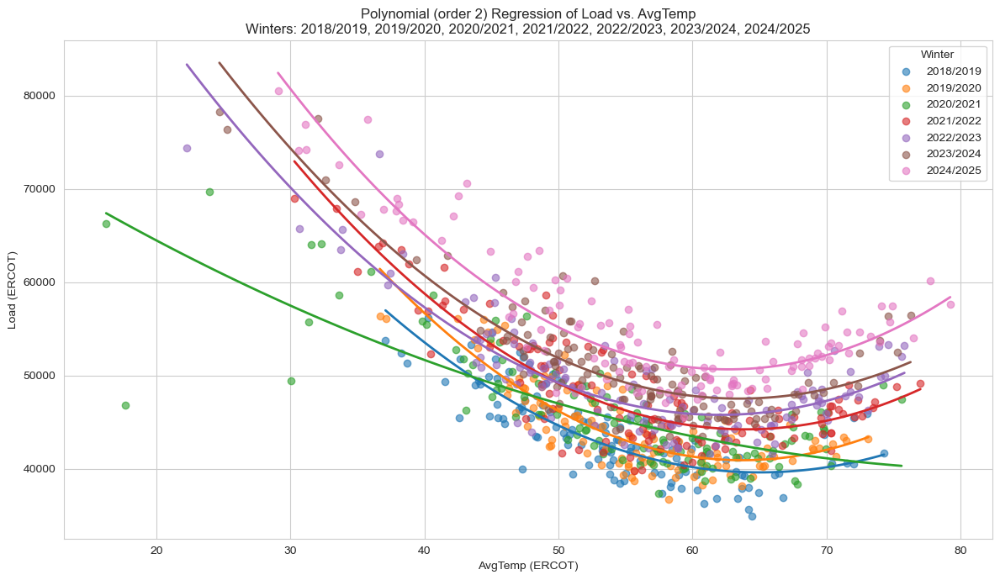

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,2.659559e+06,NaN,NaN
1,2019/2020,2.829753e+06,170194.101820,6.399335
2,2020/2021,2.520200e+06,-309553.778100,-10.939249
3,2021/2022,2.931908e+06,411708.113065,16.336329
4,2022/2023,2.881778e+06,-50129.423732,-1.709789
5,2023/2024,3.034879e+06,153100.968144,5.312725
6,2024/2025,3.266509e+06,231629.243869,7.632239


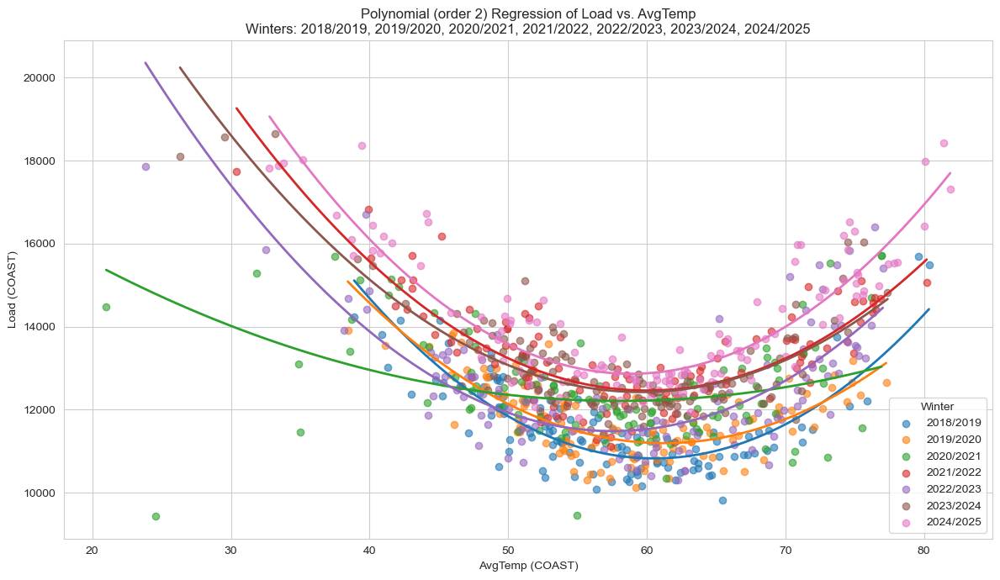

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,747047.694092,NaN,NaN
1,2019/2020,736458.964109,-10588.729983,-1.417410
2,2020/2021,654070.783158,-82388.180950,-11.187070
3,2021/2022,791365.452181,137294.669023,20.990797
4,2022/2023,716927.261943,-74438.190239,-9.406298
5,2023/2024,770067.201129,53139.939187,7.412180
6,2024/2025,825799.558409,55732.357280,7.237337


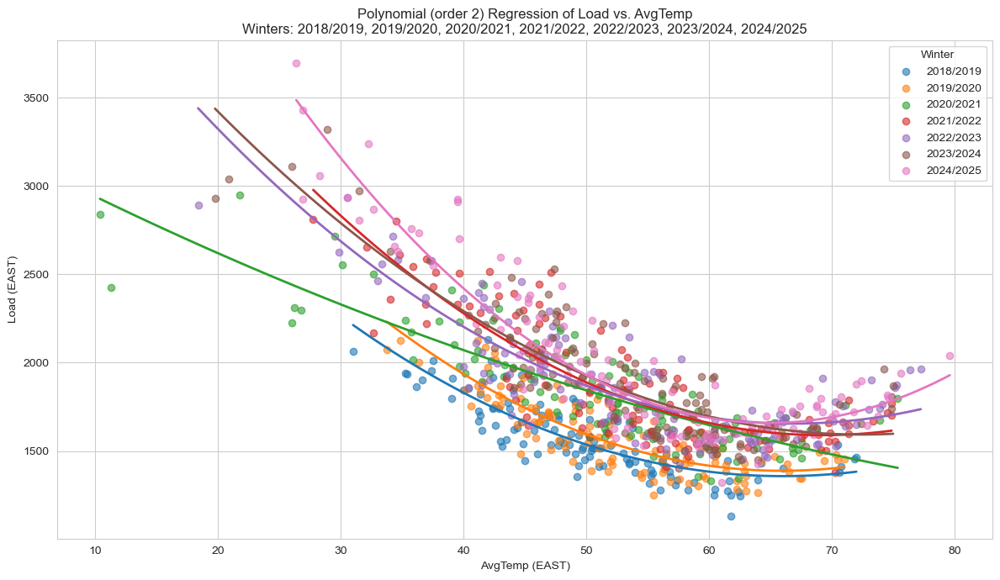

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,90566.470606,NaN,NaN
1,2019/2020,95729.777001,5163.306395,5.701124
2,2020/2021,99285.867631,3556.090630,3.714717
3,2021/2022,111591.834093,12305.966461,12.394479
4,2022/2023,108811.412886,-2780.421207,-2.491599
5,2023/2024,111582.590452,2771.177566,2.546771
6,2024/2025,120096.913638,8514.323186,7.630512


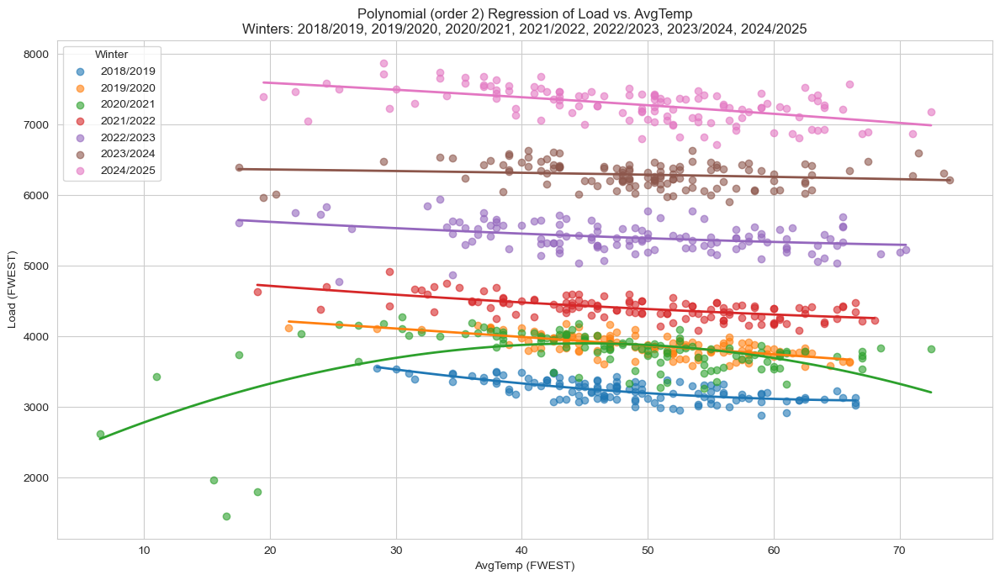

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,165915.390063,NaN,NaN
1,2019/2020,196471.651087,30556.261025,18.416773
2,2020/2021,185524.408245,-10947.242843,-5.571920
3,2021/2022,222460.352664,36935.944420,19.908941
4,2022/2023,271746.957889,49286.605224,22.155231
5,2023/2024,315095.061032,43348.103144,15.951642
6,2024/2025,366227.522151,51132.461119,16.227630


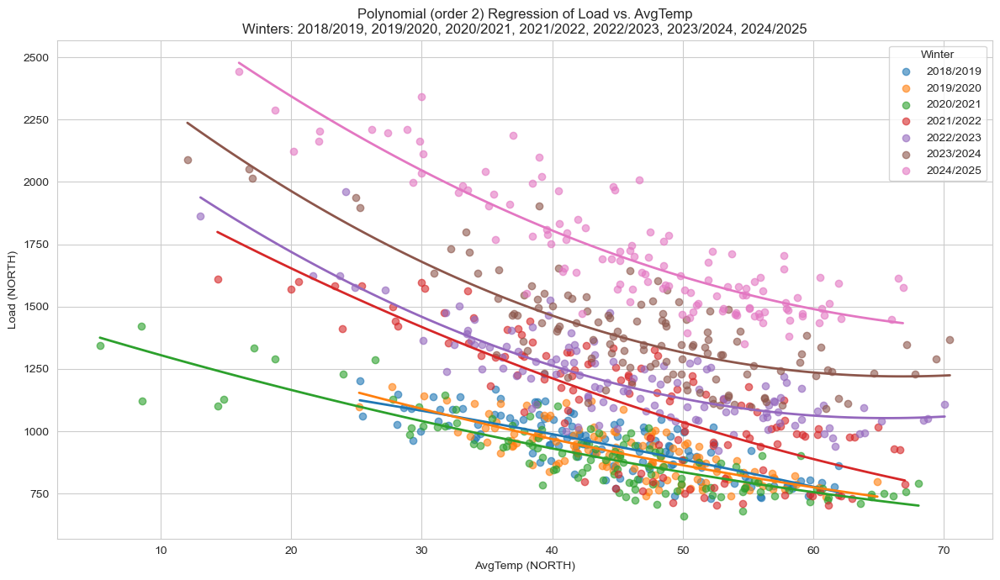

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,46518.785382,NaN,NaN
1,2019/2020,46560.516451,41.731069,0.089708
2,2020/2021,44844.925154,-1715.591297,-3.684648
3,2021/2022,57542.905049,12697.979895,28.315311
4,2022/2023,62780.338253,5237.433204,9.101788
5,2023/2024,72605.023153,9824.684900,15.649302
6,2024/2025,88181.511002,15576.487849,21.453733


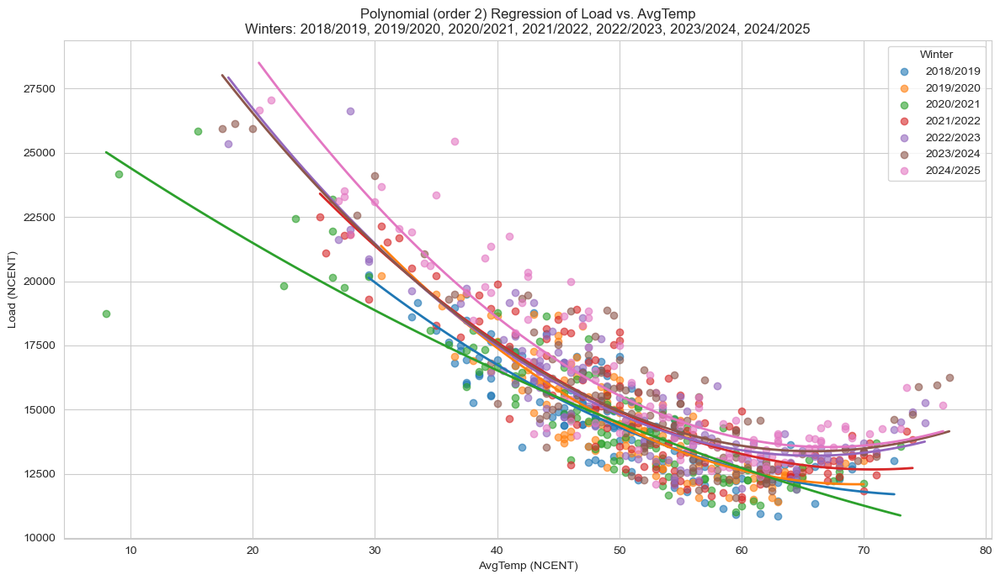

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,812209.989358,NaN,NaN
1,2019/2020,851264.611520,39054.622162,4.808439
2,2020/2021,788562.723617,-62701.887903,-7.365734
3,2021/2022,861908.402398,73345.678782,9.301185
4,2022/2023,866657.755048,4749.352649,0.551028
5,2023/2024,870356.049154,3698.294106,0.426731
6,2024/2025,916830.412499,46474.363346,5.339696


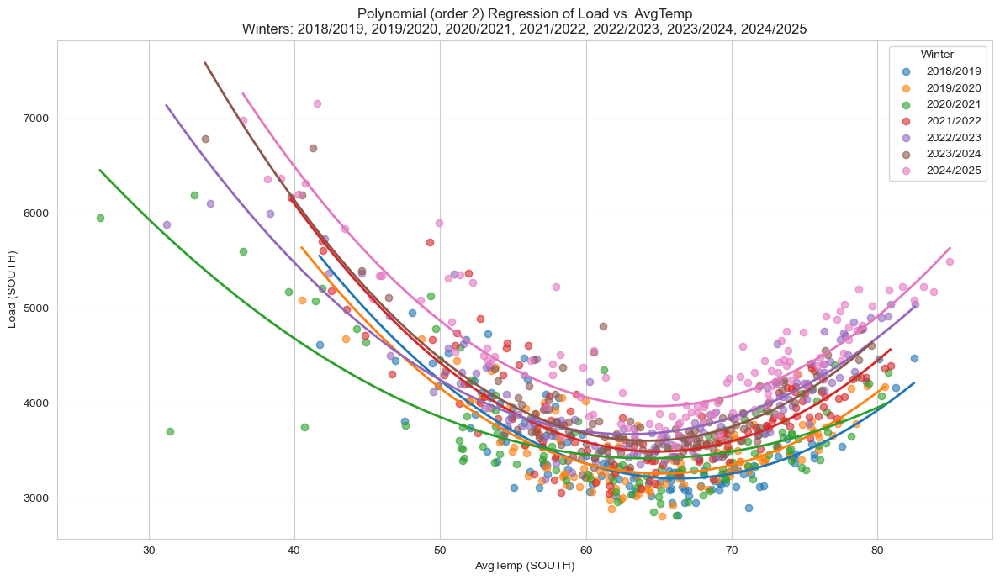

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,288618.542213,NaN,NaN
1,2019/2020,283156.194461,-5462.347752,-1.892584
2,2020/2021,232970.644064,-50185.550396,-17.723628
3,2021/2022,301600.923729,68630.279664,29.458767
4,2022/2023,274759.378318,-26841.545411,-8.899689
5,2023/2024,305006.678560,30247.300242,11.008651
6,2024/2025,321544.743171,16538.064611,5.422198


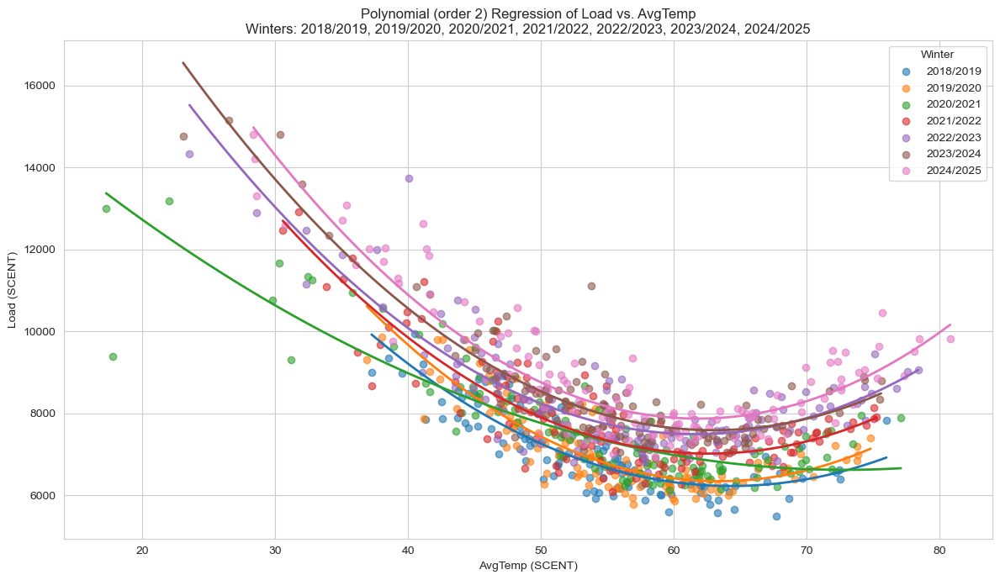

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,458202.777281,NaN,NaN
1,2019/2020,483442.921480,25240.144199,5.508510
2,2020/2021,438688.913550,-44754.007929,-9.257351
3,2021/2022,494427.932798,55739.019247,12.705819
4,2022/2023,508901.680969,14473.748172,2.927373
5,2023/2024,529098.714703,20197.033733,3.968750
6,2024/2025,549489.589974,20390.875271,3.853889


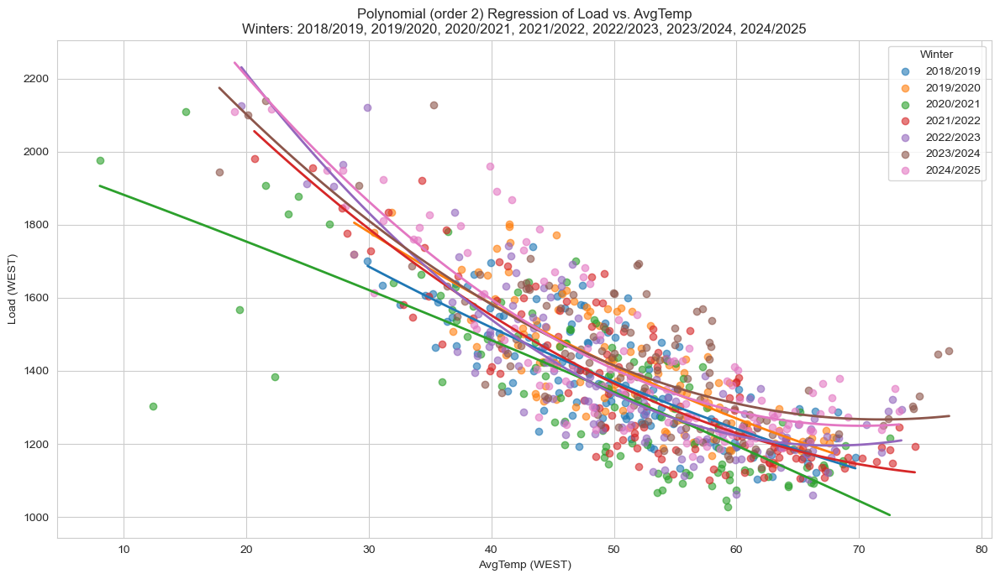

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2018/2019,73087.367148,NaN,NaN
1,2019/2020,76137.870981,3050.503834,4.173777
2,2020/2021,70435.476367,-5702.394614,-7.489564
3,2021/2022,75251.897982,4816.421615,6.838062
4,2022/2023,76012.425399,760.527417,1.010642
5,2023/2024,77780.563471,1768.138072,2.326117
6,2024/2025,78496.043293,715.479823,0.919870


In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def integrated_load_vs_weather_winter(
    df,
    winters,
    target_region,
    target_variable,
    polynomial_order=2,
    temp_min=20,
    temp_max=70
):
    """
    1. Plots scatter + polynomial regression of (region load) vs (region's target_variable)
       for specified 'winter' seasons.
    2. Integrates each fitted polynomial from temp_min to temp_max (area under the curve).
    3. Compares consecutive winters, computing absolute and percentage differences.
    4. Returns a DataFrame with integrated values and YoY changes.

    Parameters
    ----------
    df : pd.DataFrame
        Must have columns:
          - 'DATE' (datetime)
          - 'YEAR', 'MONTH' (or they will be created)
          - region load column (e.g. 'COAST')
          - region weather column (e.g. 'COAST_MinTemp', etc.)
    winters : list of str
        List of "YYYY/YYYY" strings, e.g. ["2018/2019", "2019/2020"]
        where "2018/2019" means Nov & Dec 2018 plus Jan & Feb 2019
    target_region : str
        E.g. "COAST", "NORTH", etc.
    target_variable : str
        E.g. "AvgTemp", "MinTemp", "MaxTemp", "HDD", etc.
    polynomial_order : int
        Order of polynomial fit (e.g. 2 for quadratic).
    temp_min : float
        Lower bound for integration (default 20°F).
    temp_max : float
        Upper bound for integration (default 70°F).

    Returns
    -------
    pd.DataFrame
        Columns:
          - Winter
          - IntegratedValue (area under the polynomial from temp_min to temp_max)
          - YoY_AbsChange (consecutive absolute change in integrated value)
          - YoY_PctChange (consecutive % change in integrated value)
    """

    # Ensure YEAR and MONTH exist
    if 'YEAR' not in df.columns or 'MONTH' not in df.columns:
        df['YEAR'] = df['DATE'].dt.year
        df['MONTH'] = df['DATE'].dt.month

    weather_col = f'{target_region}_{target_variable}'
    load_col = target_region

    # Prepare the plot
    sns.set_style("whitegrid")
    plt.figure(figsize=(12, 7))
    palette = sns.color_palette('tab10', n_colors=len(winters))

    # We'll store the fitted polynomials and their integrated values
    winter_polyfits = {}
    winter_integrals = {}

    sorted_winters = sorted(winters)  # sort for chronological ordering

    for i, winter_str in enumerate(sorted_winters):
        start_year_str, next_year_str = winter_str.split('/')
        start_year = int(start_year_str)
        end_year = int(next_year_str)

        # Filter for Nov/Dec of start_year and Jan/Feb of end_year
        mask = (
            ((df['YEAR'] == start_year) & (df['MONTH'].isin([11, 12]))) |
            ((df['YEAR'] == end_year) & (df['MONTH'].isin([1, 2])))
        )
        winter_df = df[mask].dropna(subset=[weather_col, load_col])

        if winter_df.empty:
            print(f"No data for winter {winter_str}.")
            continue

        # Scatter
        plt.scatter(
            winter_df[weather_col],
            winter_df[load_col],
            alpha=0.6,
            color=palette[i],
            label=winter_str
        )

        # Polynomial fit
        z = np.polyfit(winter_df[weather_col], winter_df[load_col], polynomial_order)
        p = np.poly1d(z)
        winter_polyfits[winter_str] = p

        # Plot regression line
        x_range = np.linspace(winter_df[weather_col].min(), winter_df[weather_col].max(), 100)
        plt.plot(x_range, p(x_range), color=palette[i], linewidth=2)

    # Finalize plot
    plt.xlabel(f'{target_variable} ({target_region})')
    plt.ylabel(f'Load ({target_region})')
    plt.title(
        f'Polynomial (order {polynomial_order}) Regression of Load vs. {target_variable}\n'
        f'Winters: {", ".join(sorted_winters)}'
    )
    plt.legend(title='Winter')
    plt.tight_layout()
    plt.show()

    # -------------------------------------------
    #  Compute Integrals and YoY Differences
    # -------------------------------------------
    data_rows = []
    for winter_str in sorted_winters:
        if winter_str not in winter_polyfits:
            # If no polynomial (empty data), store NaNs
            data_rows.append({
                'Winter': winter_str,
                'IntegratedValue': np.nan,
                'YoY_AbsChange': np.nan,
                'YoY_PctChange': np.nan
            })
            continue

        p = winter_polyfits[winter_str]
        p_int = p.integ()  # indefinite integral
        area = p_int(temp_max) - p_int(temp_min)  # definite integral in [temp_min, temp_max]
        winter_integrals[winter_str] = area

    # Now build a DataFrame with consecutive comparisons
    prev_winter = None
    for winter_str in sorted_winters:
        if winter_str not in winter_integrals:
            # store row with no data
            data_rows.append({
                'Winter': winter_str,
                'IntegratedValue': np.nan,
                'YoY_AbsChange': np.nan,
                'YoY_PctChange': np.nan
            })
            continue

        current_area = winter_integrals[winter_str]
        if prev_winter is None or (prev_winter not in winter_integrals):
            # first winter => no yoy comparison
            yoy_abs = np.nan
            yoy_pct = np.nan
        else:
            prev_area = winter_integrals[prev_winter]
            if pd.isna(prev_area) or prev_area == 0:
                yoy_abs = np.nan
                yoy_pct = np.nan
            else:
                yoy_abs = current_area - prev_area
                yoy_pct = (yoy_abs / prev_area) * 100

        data_rows.append({
            'Winter': winter_str,
            'IntegratedValue': current_area,
            'YoY_AbsChange': yoy_abs,
            'YoY_PctChange': yoy_pct
        })

        prev_winter = winter_str

    # Build final results DataFrame
    # We might have duplicates for each winter if we appended rows in the first loop
    # and second loop. To avoid that, we'll create a dictionary in a single pass:
    # but it's okay if you prefer a simpler approach. We'll handle it carefully:

    # We can do a simpler approach: just create in second loop. So let's revise:
    # We'll only create the final rows in the second loop, so we don't have duplicates.

    # Let's do that approach below, rewriting final steps more cleanly:

    final_data = []
    prev_winter = None
    for winter_str in sorted_winters:
        if winter_str not in winter_integrals:
            # no data => store NaN
            final_data.append({
                'Winter': winter_str,
                'IntegratedValue': np.nan,
                'YoY_AbsChange': np.nan,
                'YoY_PctChange': np.nan
            })
            continue

        current_area = winter_integrals[winter_str]
        if (prev_winter is None) or (prev_winter not in winter_integrals):
            yoy_abs = np.nan
            yoy_pct = np.nan
        else:
            prev_area = winter_integrals[prev_winter]
            if pd.isna(prev_area) or prev_area == 0:
                yoy_abs = np.nan
                yoy_pct = np.nan
            else:
                yoy_abs = current_area - prev_area
                yoy_pct = (yoy_abs / prev_area) * 100

        final_data.append({
            'Winter': winter_str,
            'IntegratedValue': current_area,
            'YoY_AbsChange': yoy_abs,
            'YoY_PctChange': yoy_pct
        })

        prev_winter = winter_str

    results_df = pd.DataFrame(final_data)
    # For clarity, let's keep the same order as sorted_winters
    results_df = results_df.set_index('Winter').reindex(sorted_winters).reset_index()

    return results_df




regions = ['ERCOT', 'COAST', 'EAST', 'FWEST', 'NORTH', 'NCENT', 'SOUTH', 'SCENT', 'WEST']


for region in regions: 
    # Example usage:
    winters_list = ["2018/2019", "2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"]
    results_df = integrated_load_vs_weather_winter(
        df=combined_df,
        winters=winters_list,
        target_region=region,
        target_variable="AvgTemp",
        polynomial_order=2,
        temp_min=20,
        temp_max=70
    )
    display(results_df)




# Look at grouped load events per calendar year

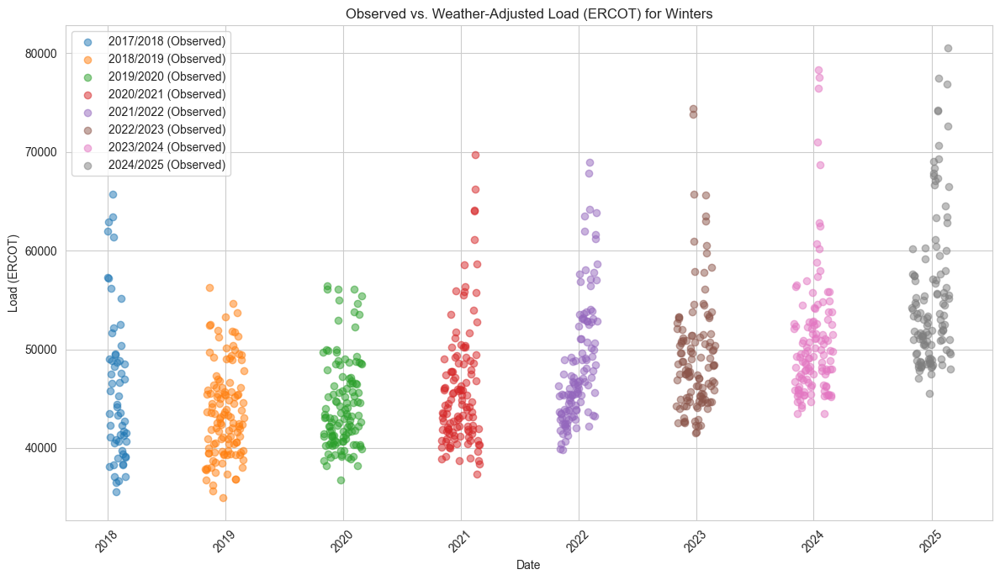

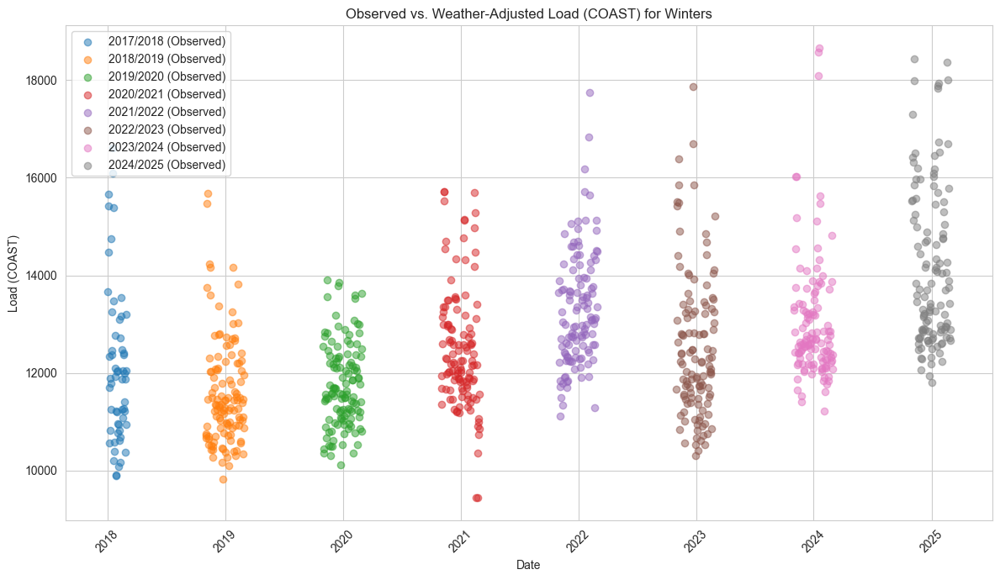

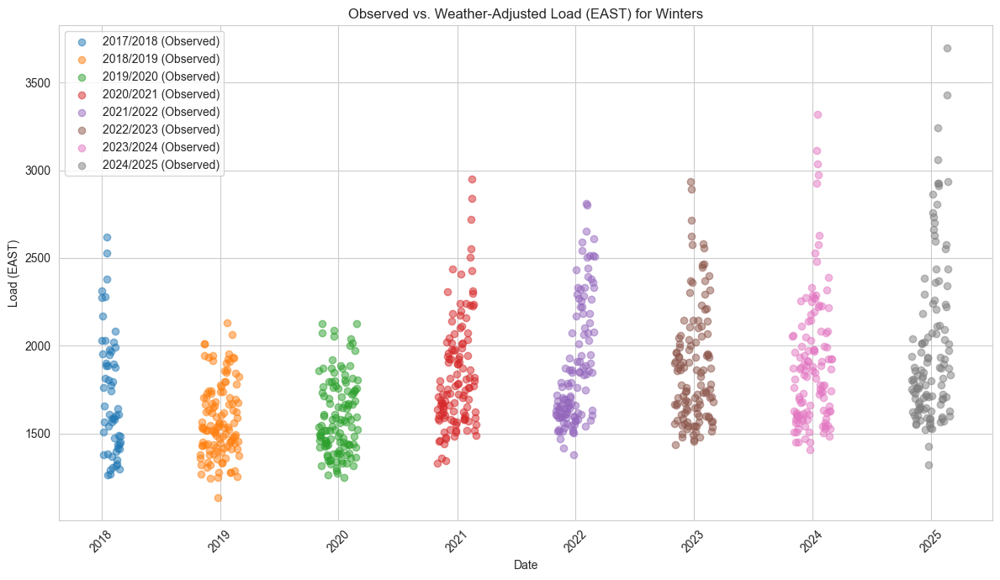

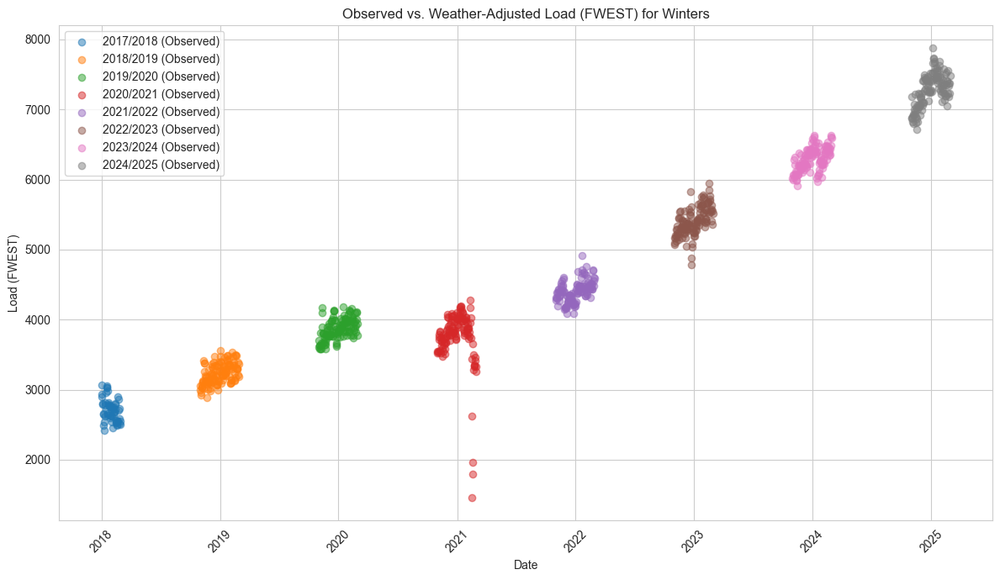

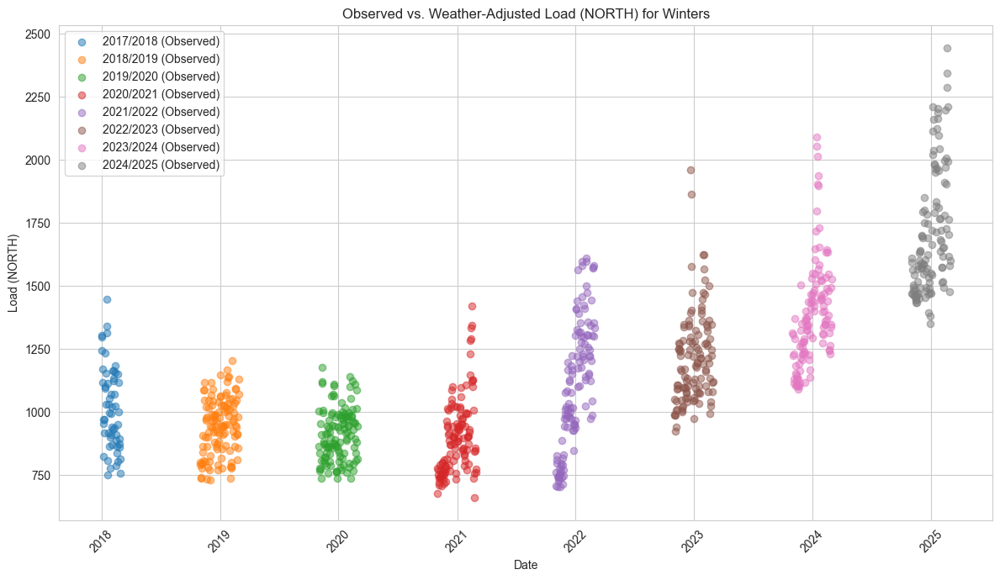

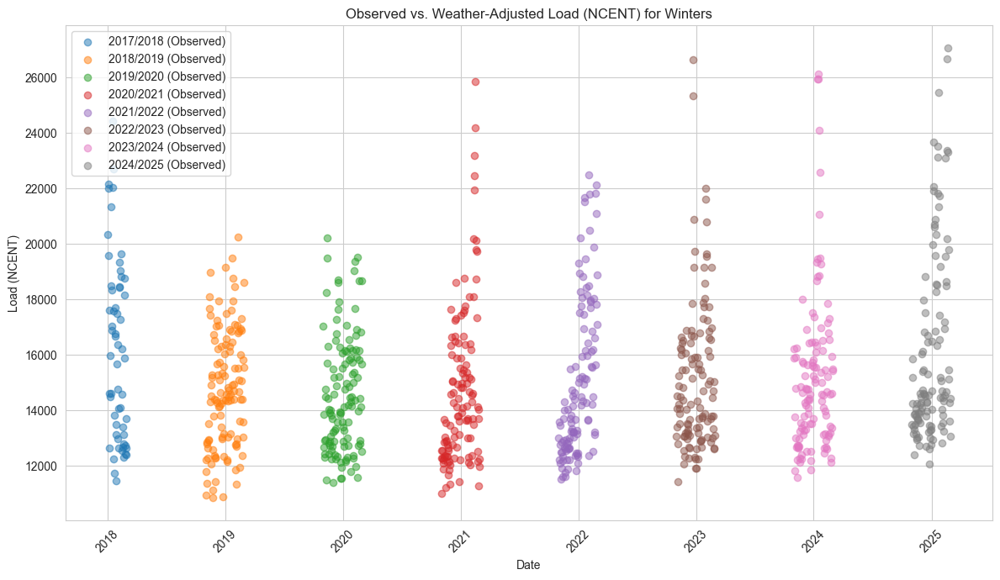

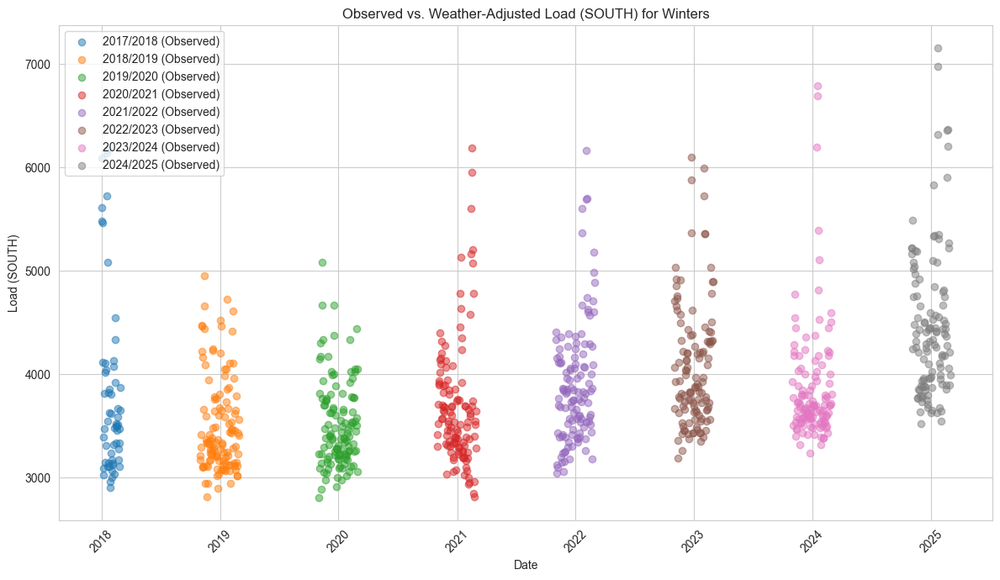

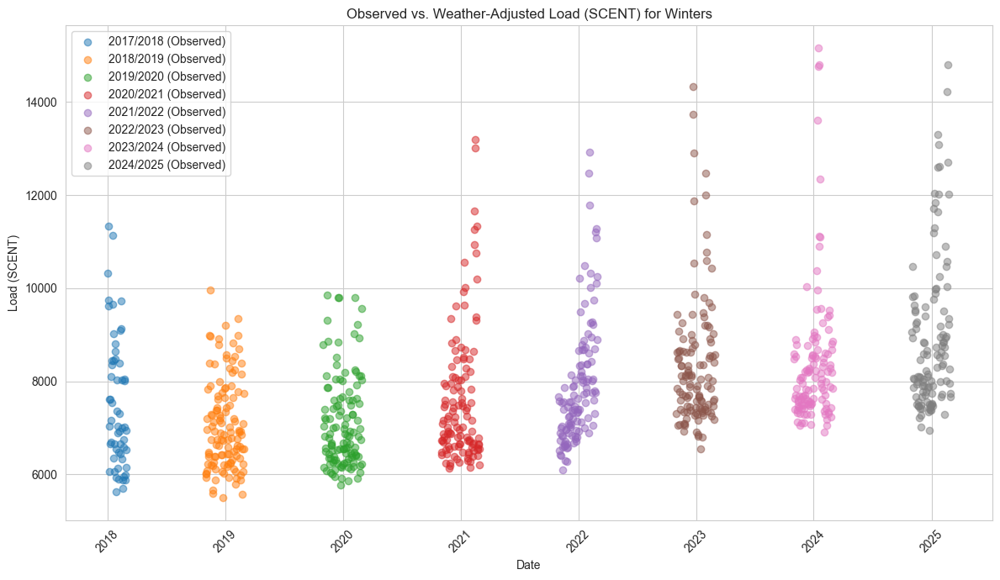

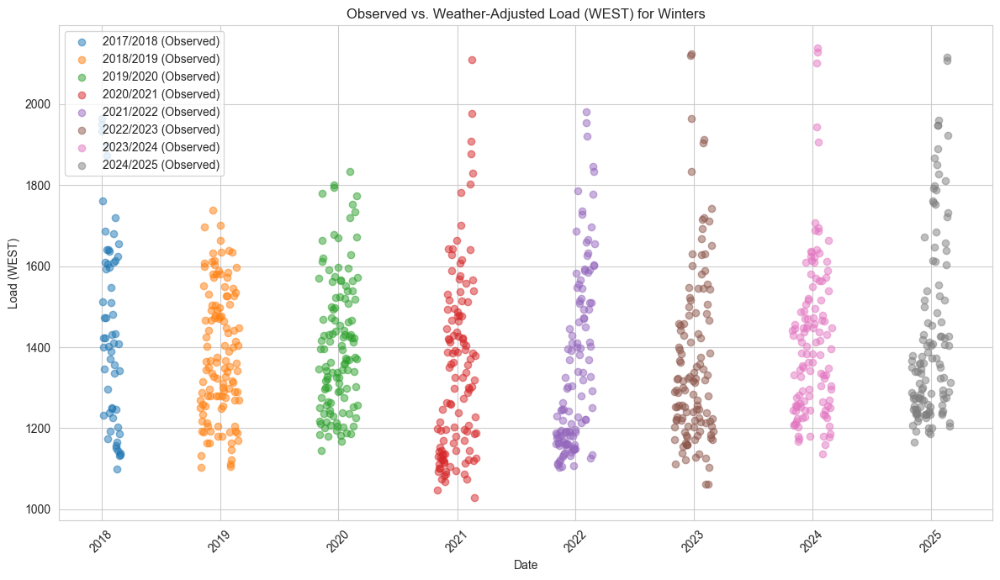

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

def analyze_winter_load(df, region, weather_var, poly_order=2):
    # Define relevant columns
    weather_col = f'{region}_{weather_var}'
    load_col = region
    
    # Convert DATE column to datetime if not already
    df['DATE'] = pd.to_datetime(df['DATE'])
    df['MONTH'] = df['DATE'].dt.month
    df['YEAR'] = df['DATE'].dt.year

    # Identify winter years (Nov - Feb spans two years)
    df['Winter_Year'] = np.where(df['MONTH'] >= 11, 
                                 df['YEAR'], 
                                 df['YEAR'] - 1)
    
    df['Winter_Label'] = df['Winter_Year'].astype(str) + "/" + (df['Winter_Year'] + 1).astype(str)

    # Filter for only winter months (Nov-Feb)
    winter_df = df[df['MONTH'].isin([11, 12, 1, 2])].dropna(subset=[weather_col, load_col])

    # Polynomial regression to estimate weather-adjusted load
    X = winter_df[[weather_col]]
    y = winter_df[load_col]

    poly = PolynomialFeatures(poly_order)
    X_poly = poly.fit_transform(X)

    model = LinearRegression()
    model.fit(X_poly, y)

    # Predict adjusted load
    winter_df['Weather_Adjusted_Load'] = model.predict(X_poly)

    # Plot each winter separately
    sns.set_style("whitegrid")
    plt.figure(figsize=(12, 7))

    unique_winters = sorted(winter_df['Winter_Label'].unique())
    colors = sns.color_palette('tab10', n_colors=len(unique_winters))

    for i, winter in enumerate(unique_winters):
        subset = winter_df[winter_df['Winter_Label'] == winter]
        
        plt.scatter(subset['DATE'], subset[load_col], alpha=0.5, label=f"{winter} (Observed)", color=colors[i])
        # plt.plot(subset['DATE'], subset['Weather_Adjusted_Load'], linestyle="dashed", linewidth=2, label=f"{winter} (Adjusted)", color=colors[i])

    plt.xlabel('Date')
    plt.ylabel(f'Load ({region})')
    plt.title(f'Observed vs. Weather-Adjusted Load ({region}) for Winters')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return winter_df


regions = ['ERCOT', 'COAST', 'EAST', 'FWEST', 'NORTH', 'NCENT', 'SOUTH', 'SCENT', 'WEST']

for region in regions:
# Example usage
    winter_data = analyze_winter_load(combined_df, region=region, weather_var='AvgTemp', poly_order=2)


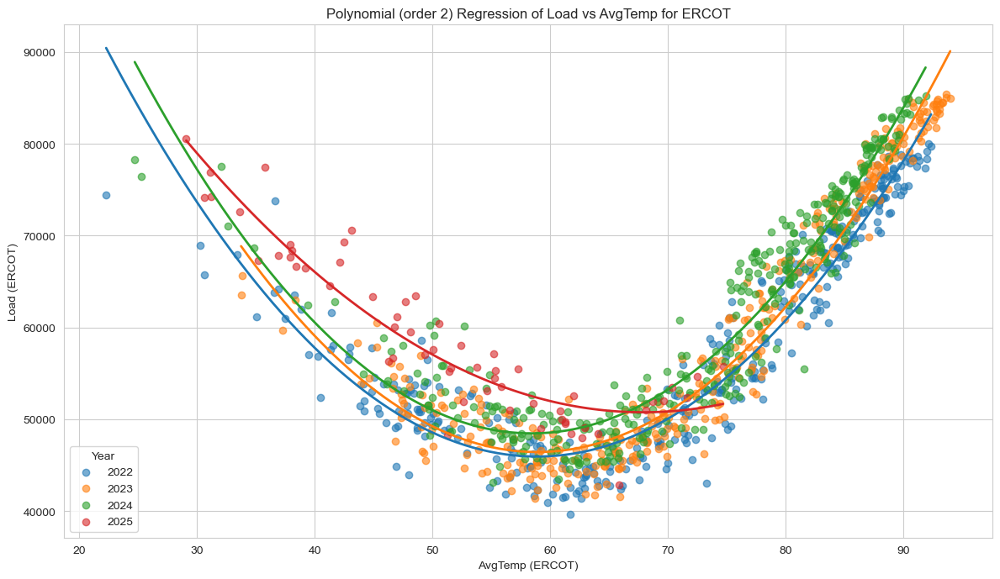

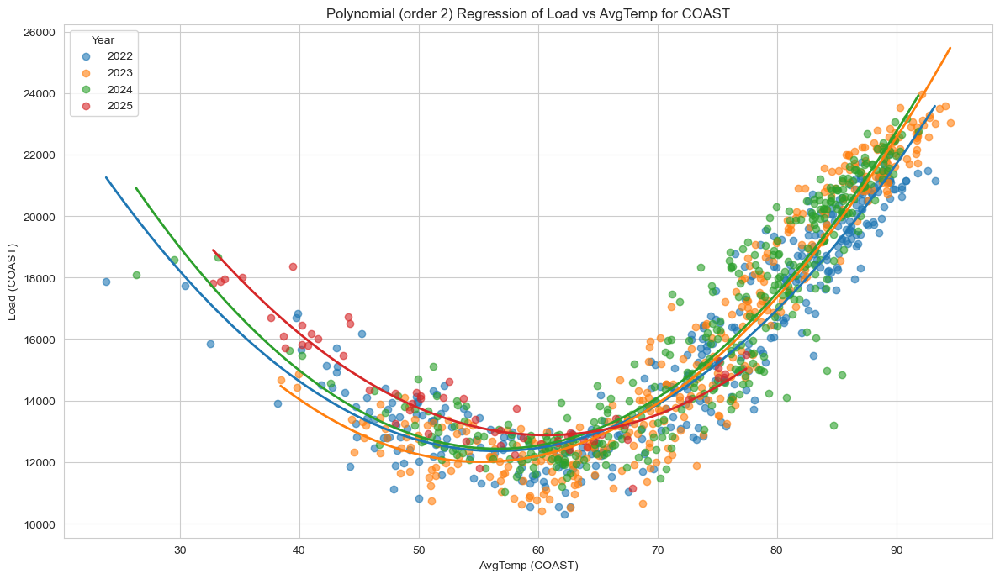

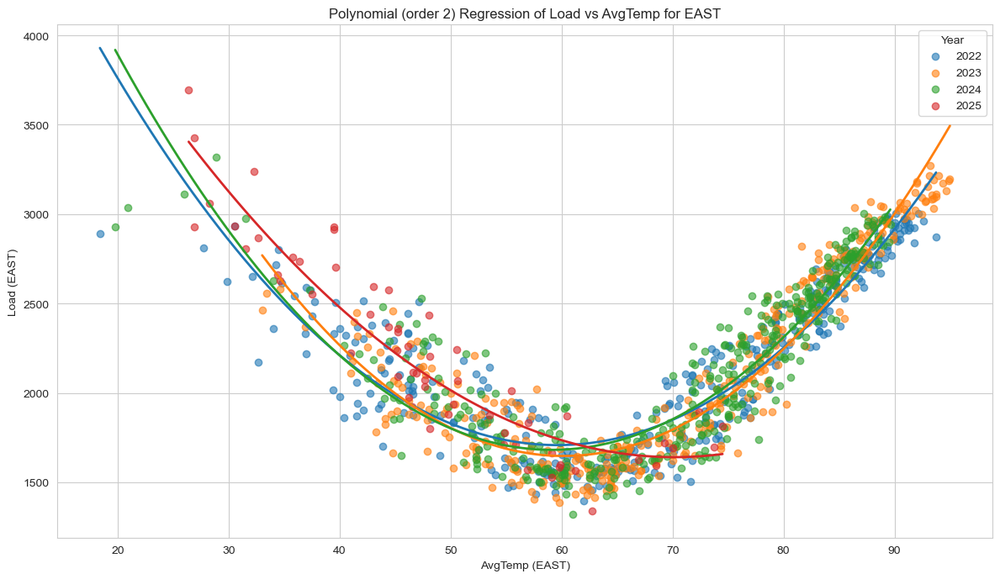

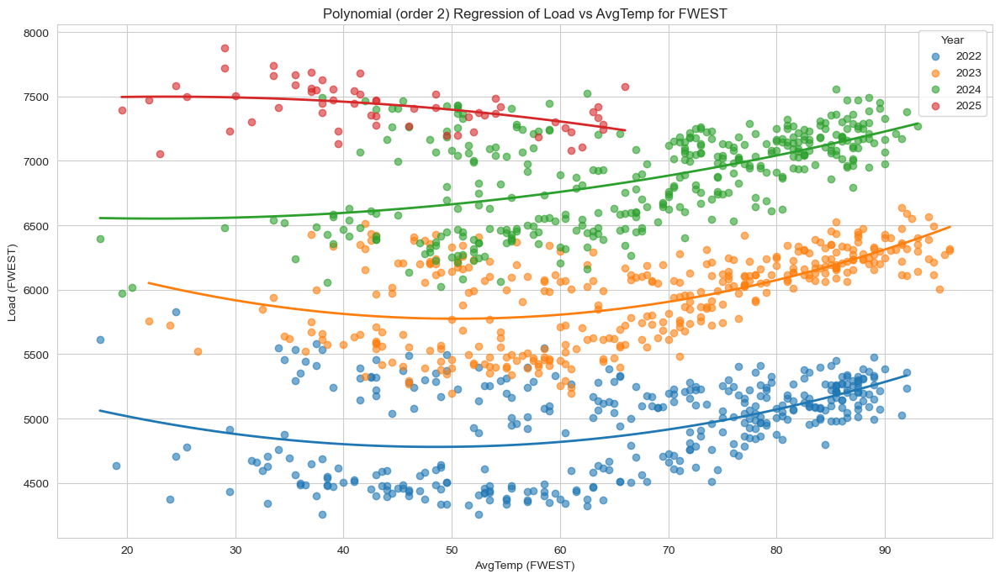

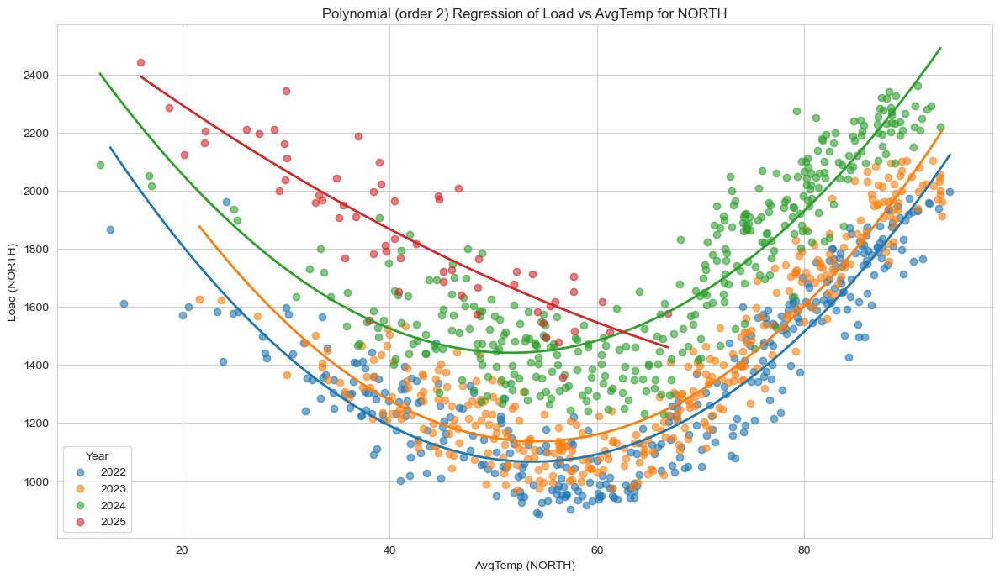

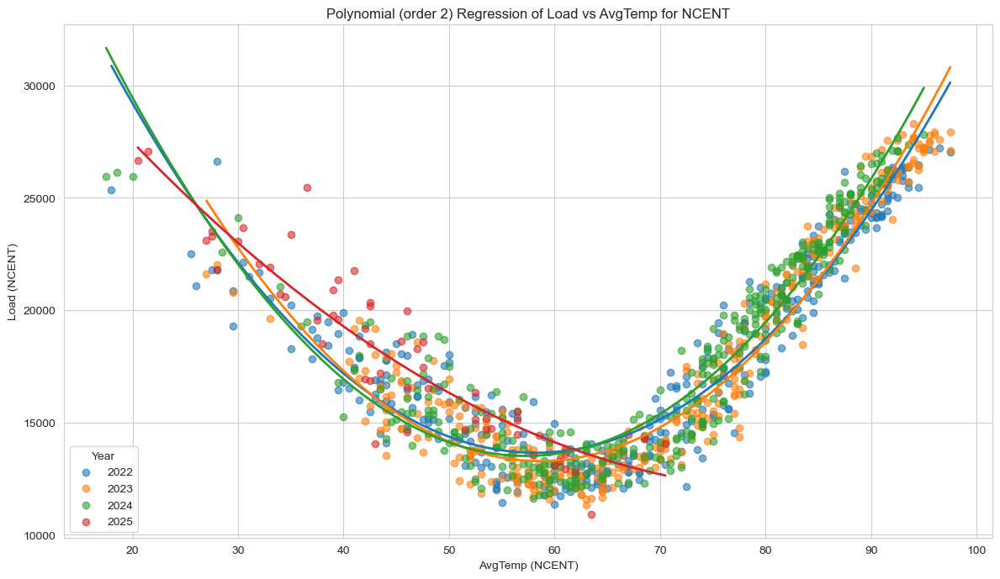

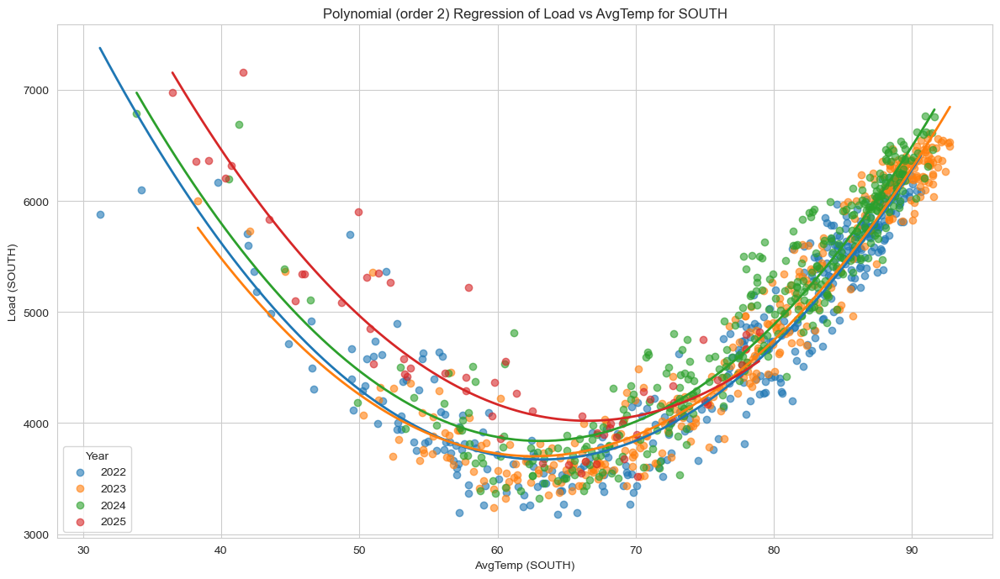

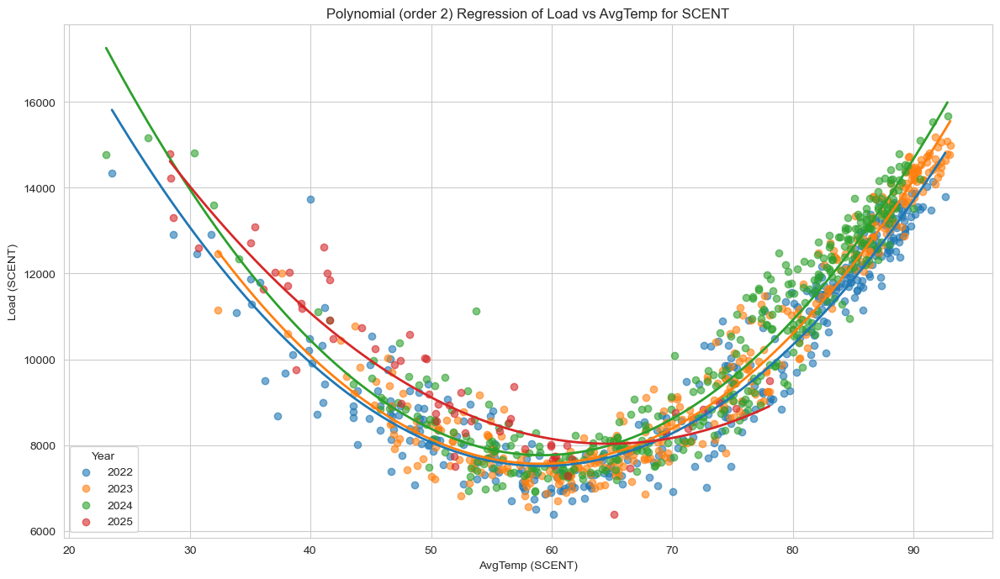

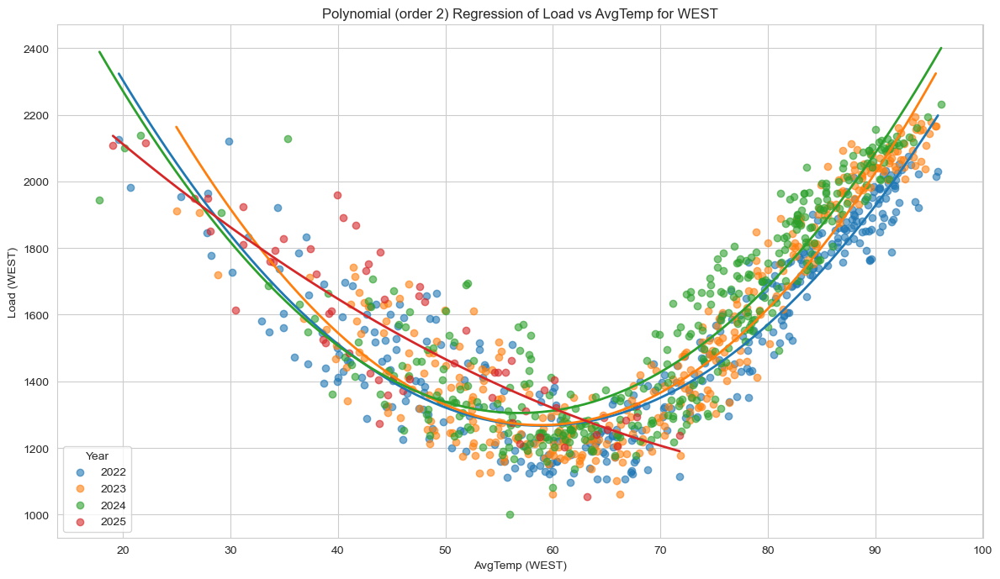

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_load_vs_weather(df, target_region, target_variable, polynomial_order=2, years=None, months=None):
    # Column names
    weather_col = f'{target_region}_{target_variable}'
    load_col = target_region

    # Extract year and month from DATE column
    df['YEAR'] = df['DATE'].dt.year
    df['MONTH'] = df['DATE'].dt.month

    # Filter based on years and months if provided
    if years is not None:
        df = df[df['YEAR'].isin(years)]
    if months is not None:
        df = df[df['MONTH'].isin(months)]

    # Set up plot aesthetics
    sns.set_style("whitegrid")
    plt.figure(figsize=(12, 7))

    unique_years = sorted(df['YEAR'].unique())
    colors = sns.color_palette('tab10', n_colors=len(unique_years))

    for i, year in enumerate(unique_years):
        yearly_data = df[df['YEAR'] == year].dropna(subset=[weather_col, load_col])

        # Scatter plot
        plt.scatter(
            yearly_data[weather_col],
            yearly_data[load_col],
            alpha=0.6,
            color=colors[i],
            label=f'{year}'
        )

        # Polynomial regression
        z = np.polyfit(yearly_data[weather_col], yearly_data[load_col], polynomial_order)
        p = np.poly1d(z)

        # Plot regression line
        x_range = np.linspace(yearly_data[weather_col].min(), yearly_data[weather_col].max(), 100)
        plt.plot(x_range, p(x_range), color=colors[i], linewidth=2)

    # Labels and title
    plt.xlabel(f'{target_variable} ({target_region})')
    plt.ylabel(f'Load ({target_region})')
    plt.title(f'Polynomial (order {polynomial_order}) Regression of Load vs {target_variable} for {target_region}')
    plt.legend(title='Year')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_load_vs_weather(combined_df, 'ERCOT', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'COAST', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'EAST', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'FWEST', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'NORTH', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'NCENT', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'SOUTH', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'SCENT', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'WEST', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])


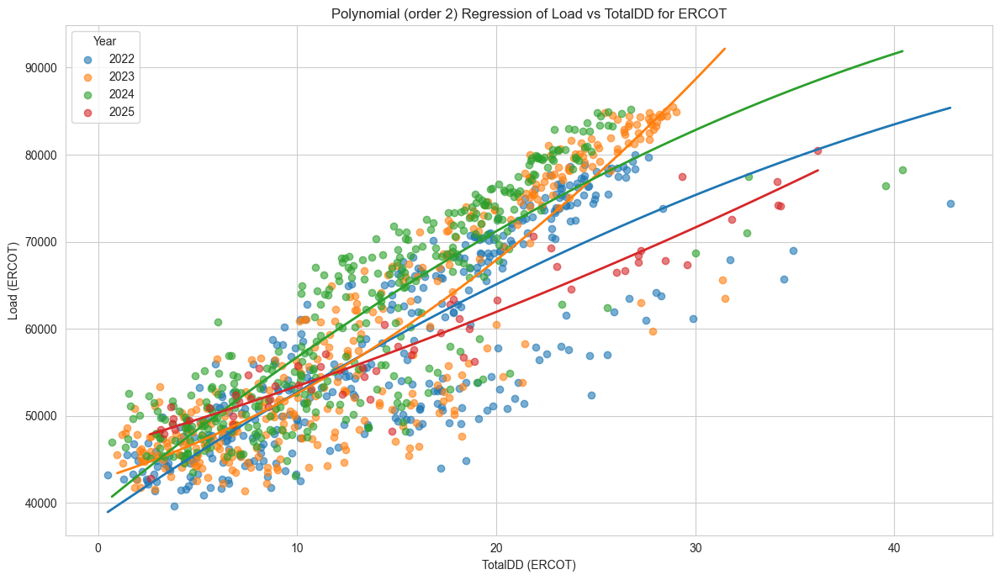

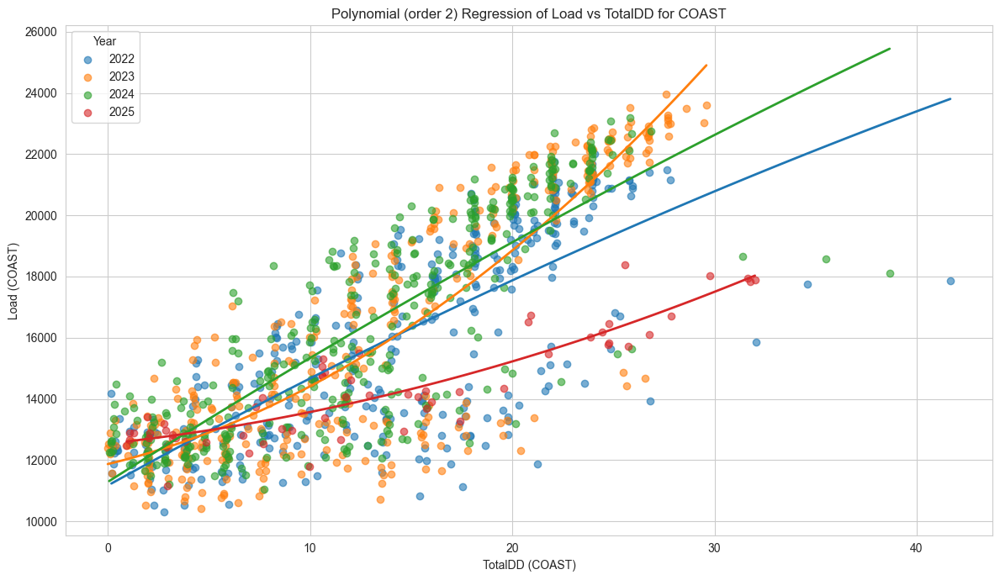

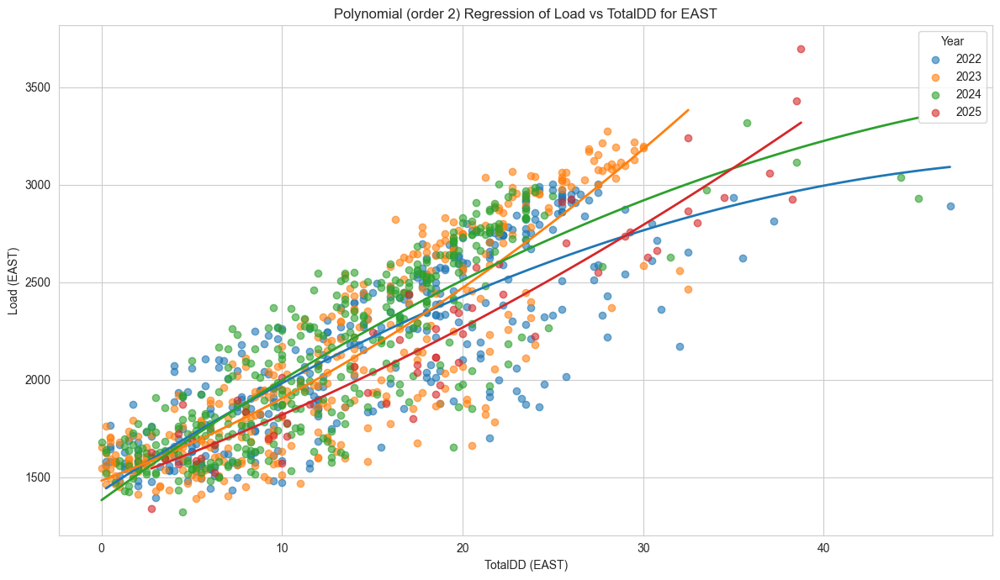

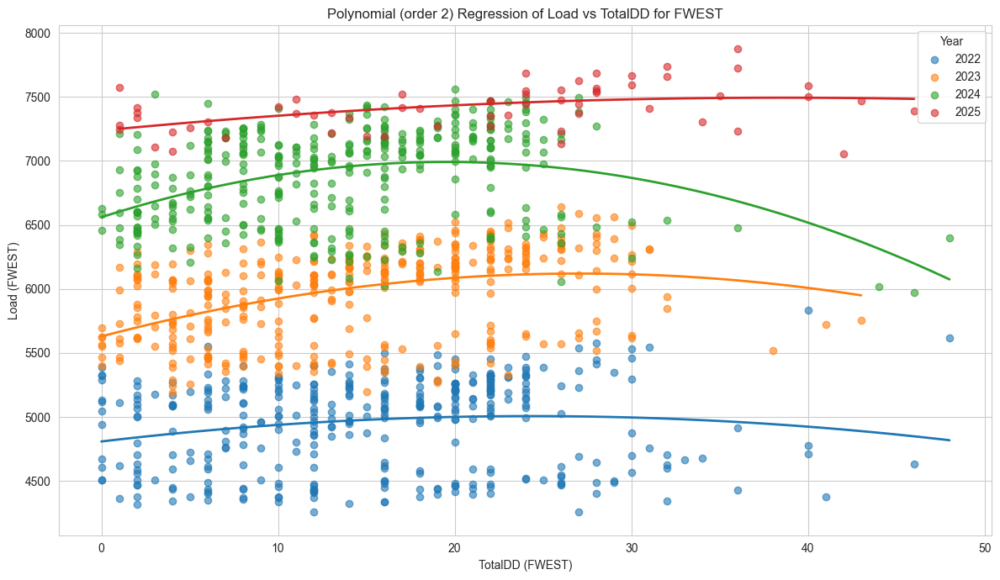

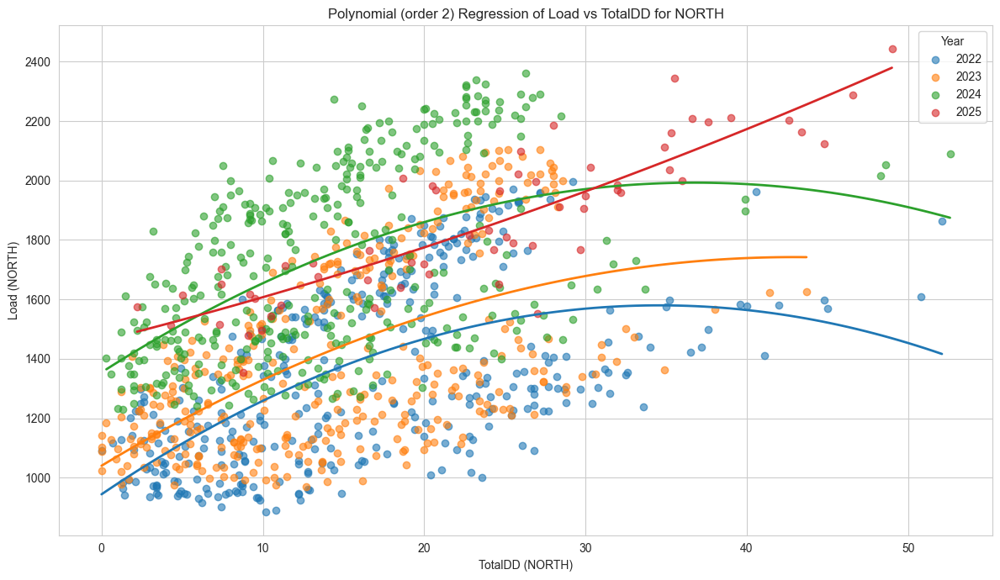

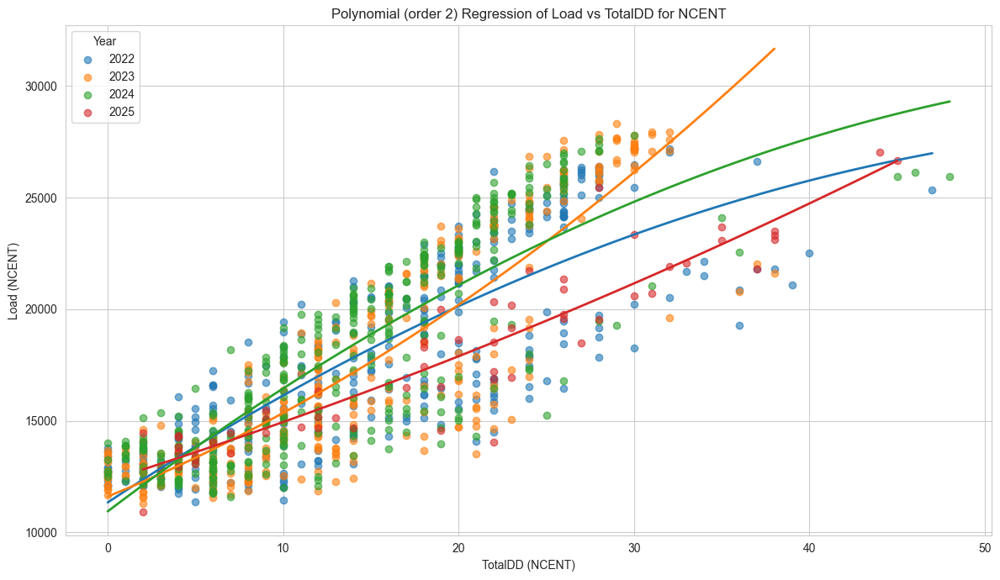

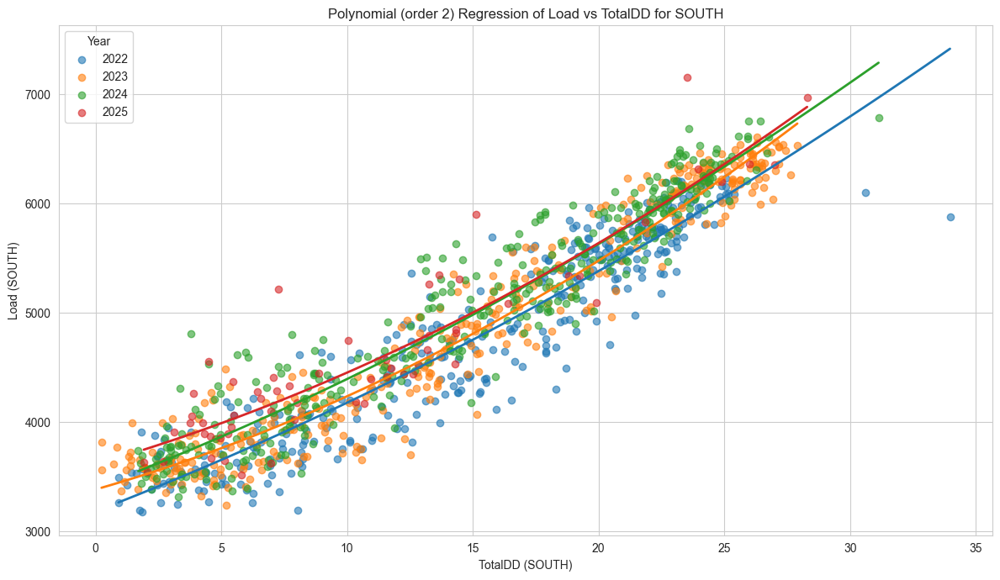

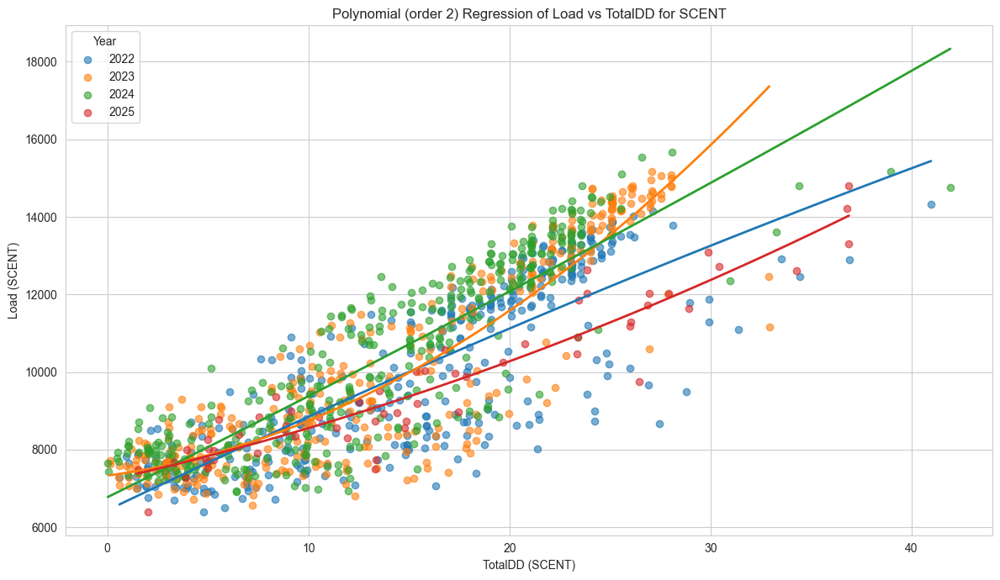

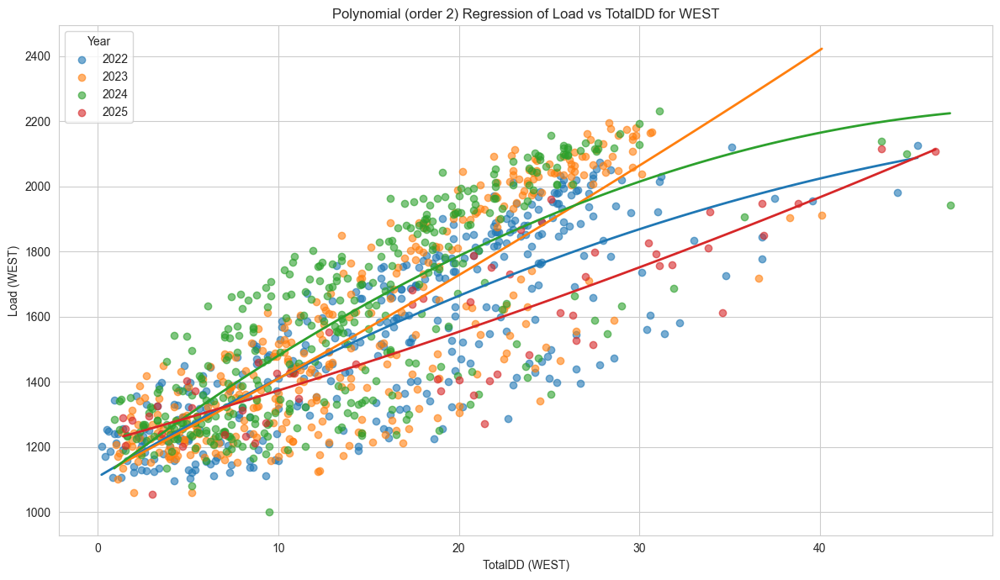

In [14]:
plot_load_vs_weather(combined_df, 'ERCOT', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'COAST', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'EAST', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'FWEST', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'NORTH', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'NCENT', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'SOUTH', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'SCENT', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])
plot_load_vs_weather(combined_df, 'WEST', 'TotalDD', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])

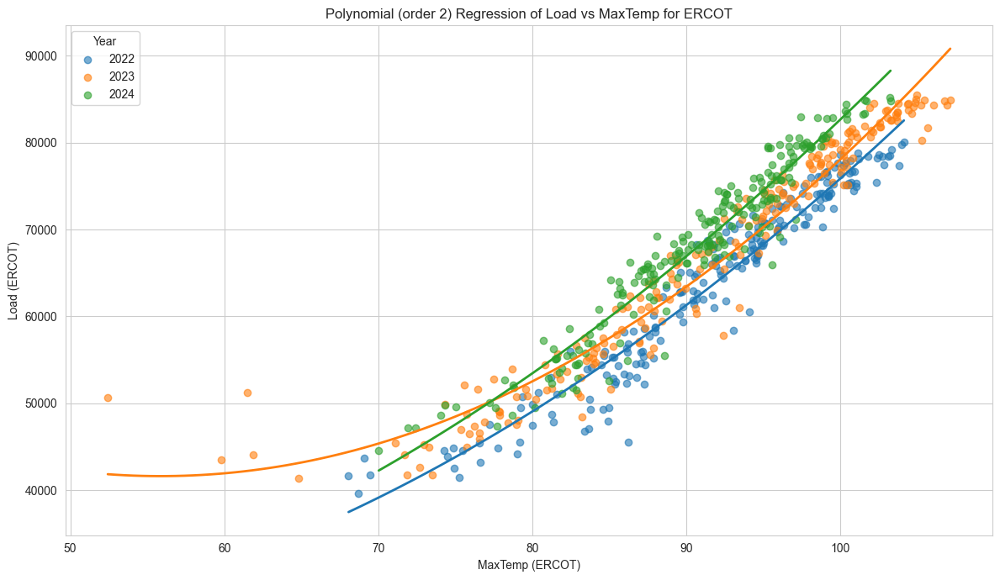

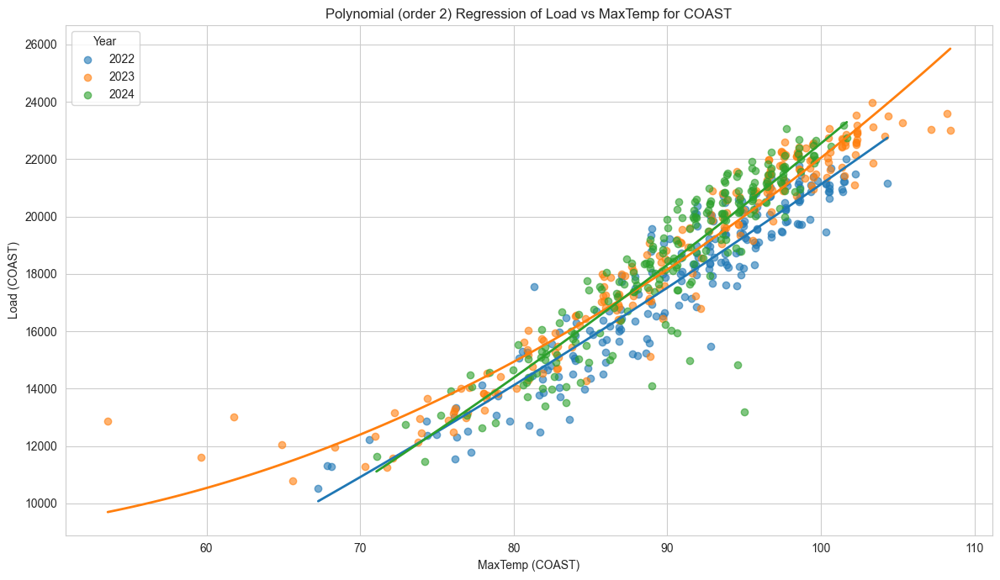

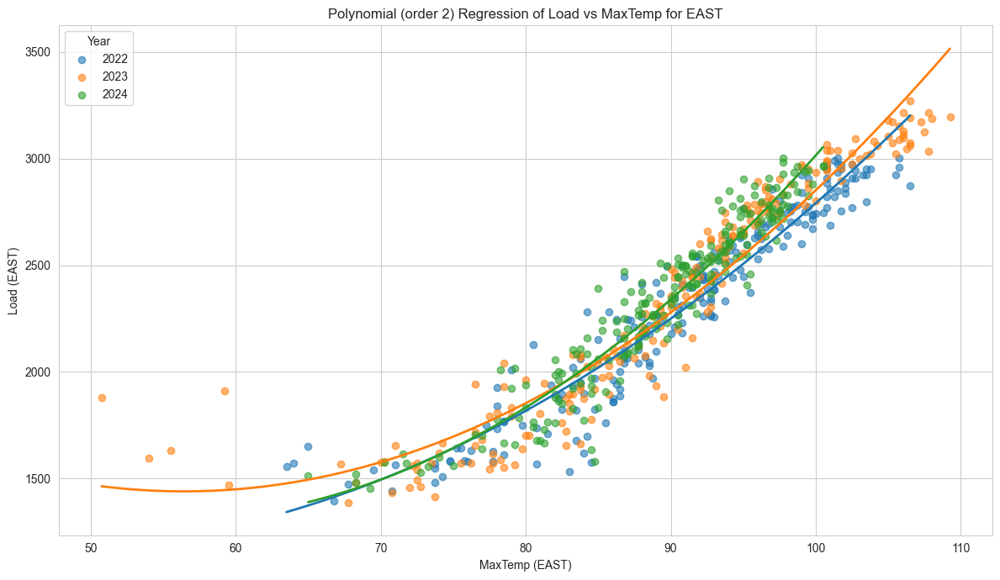

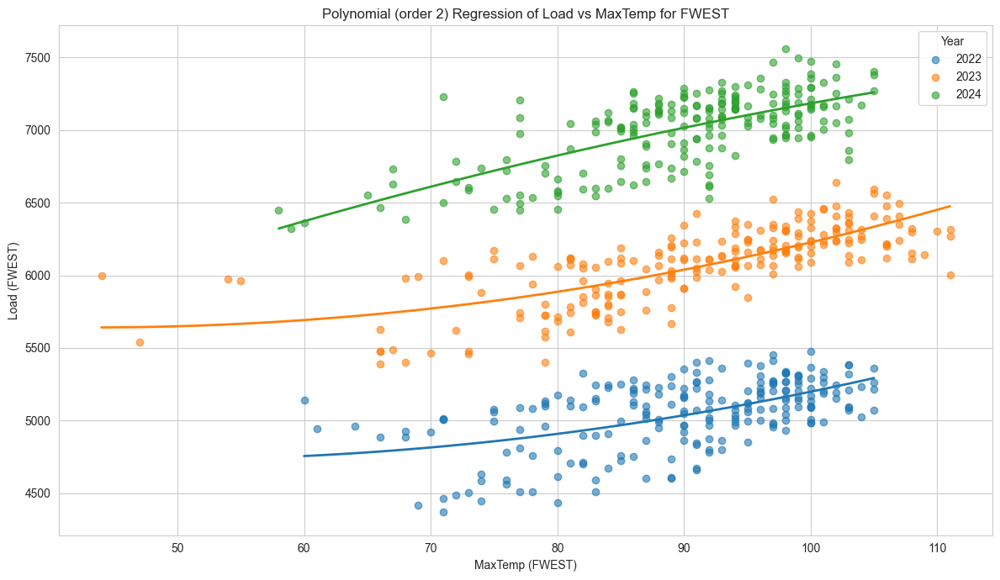

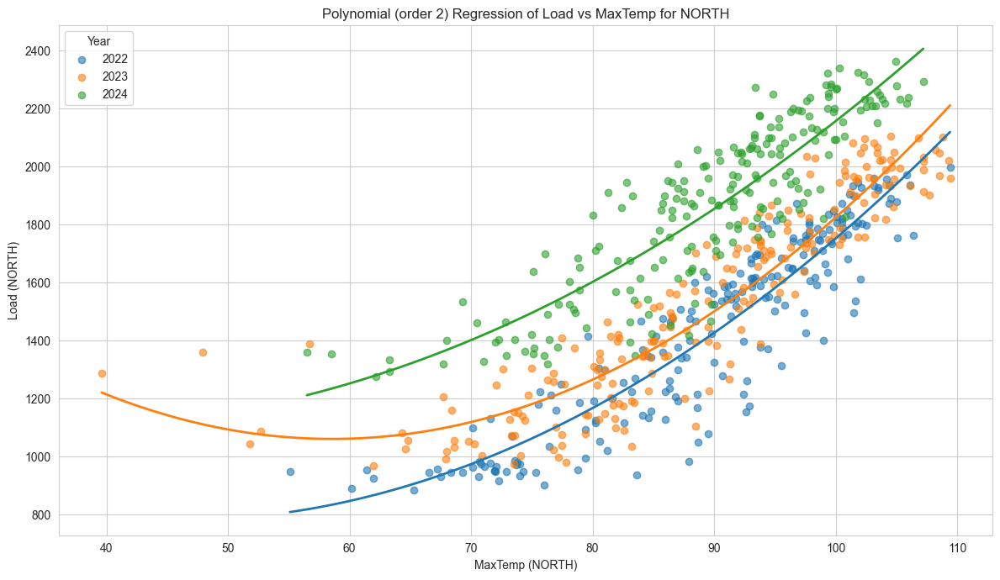

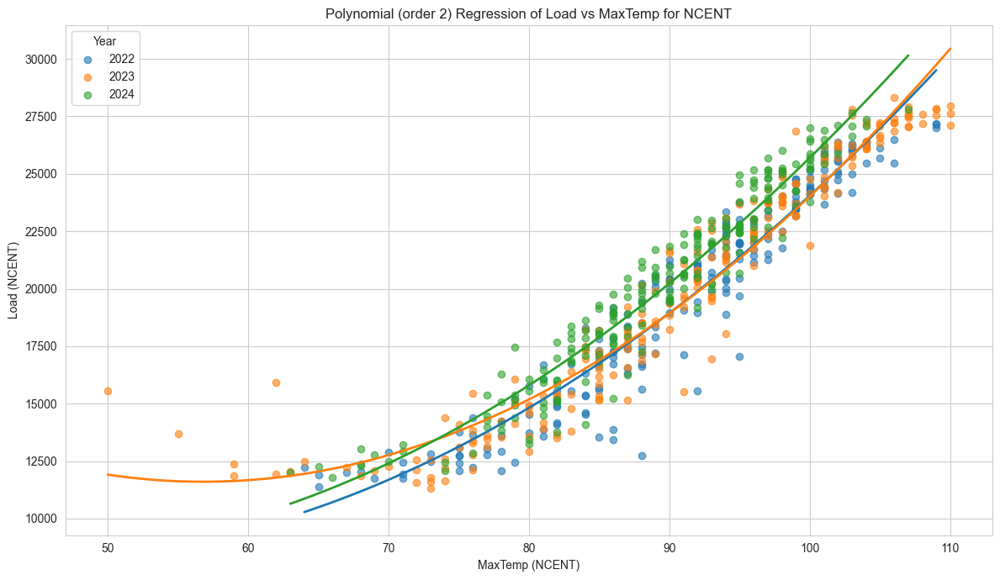

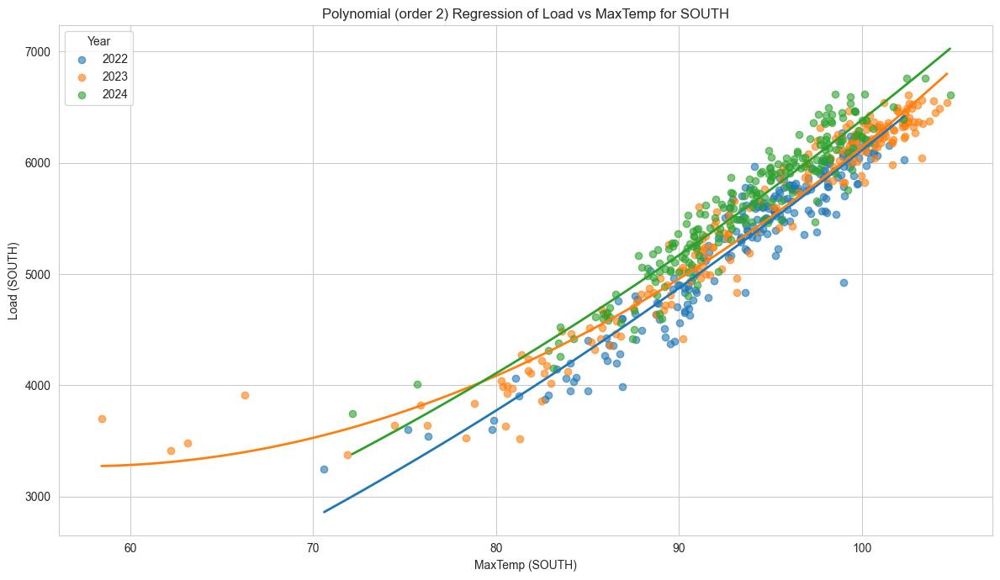

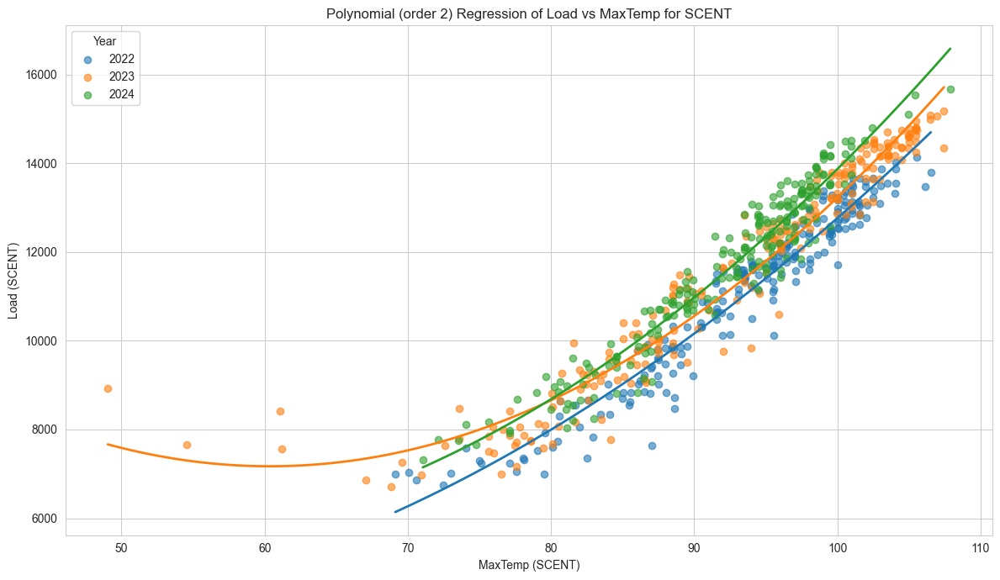

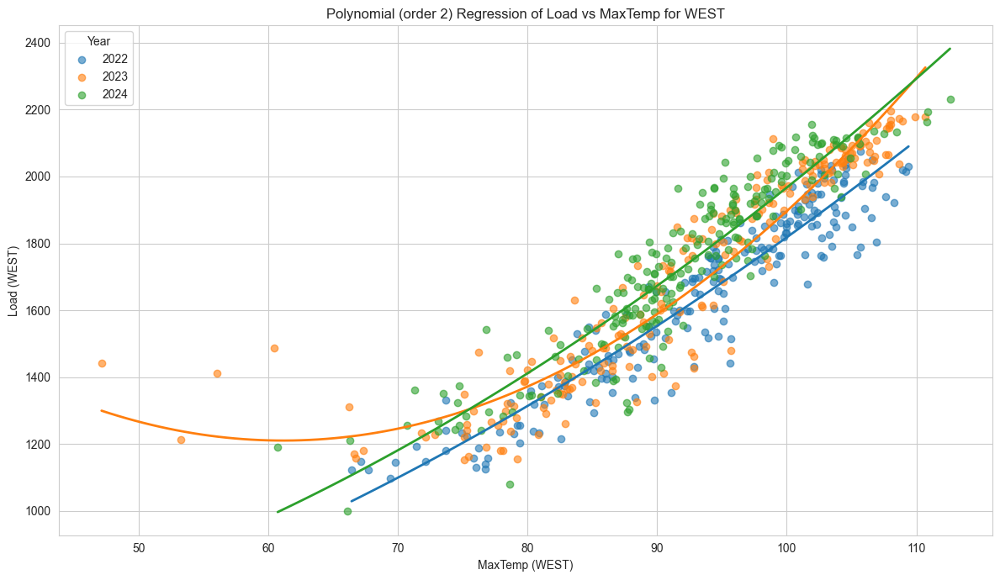

In [15]:
# summer months and max temp
plot_load_vs_weather(combined_df, 'ERCOT', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'COAST', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'EAST', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'FWEST', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'NORTH', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'NCENT', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'SOUTH', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'SCENT', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])
plot_load_vs_weather(combined_df, 'WEST', 'MaxTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[4,5,6,7,8,9,10])

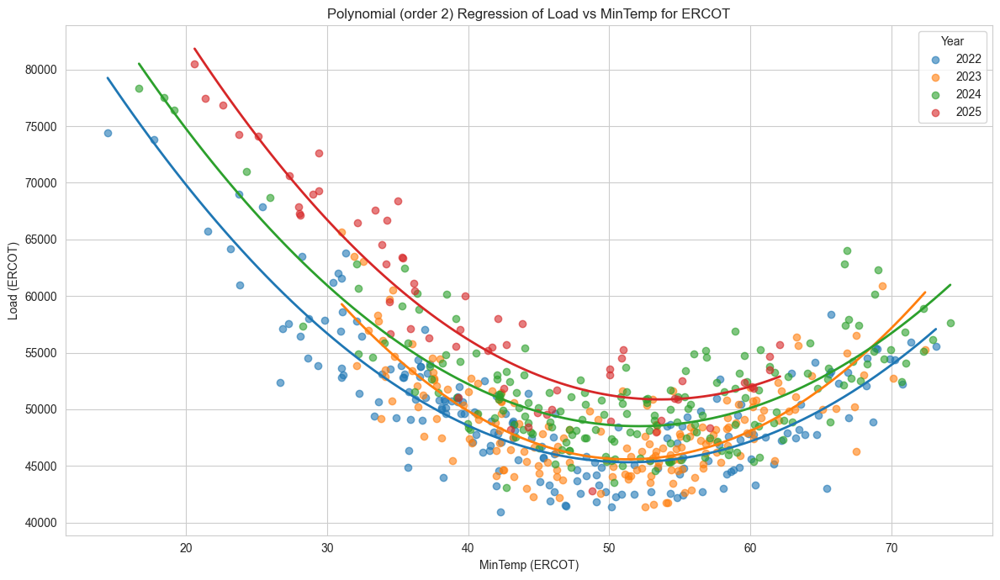

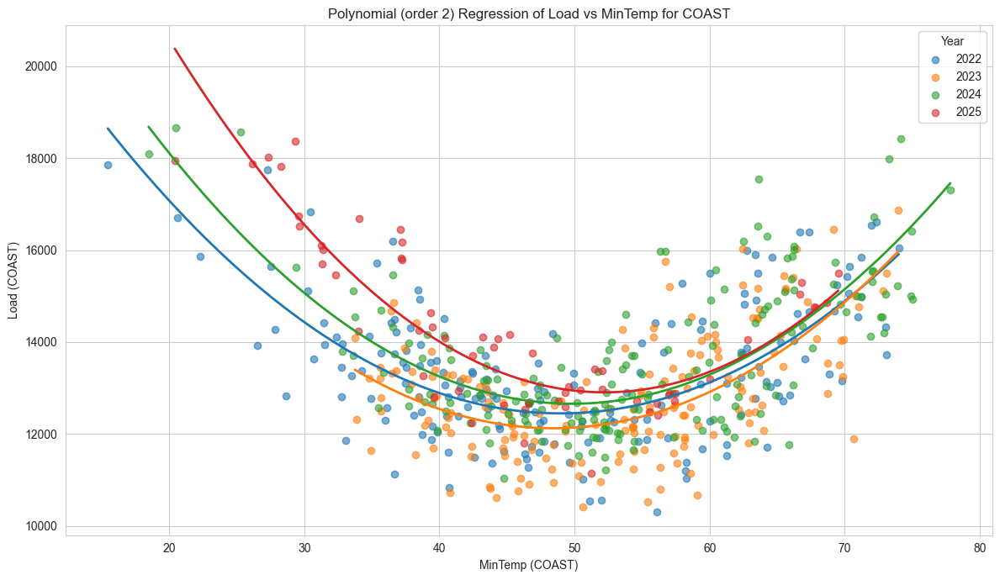

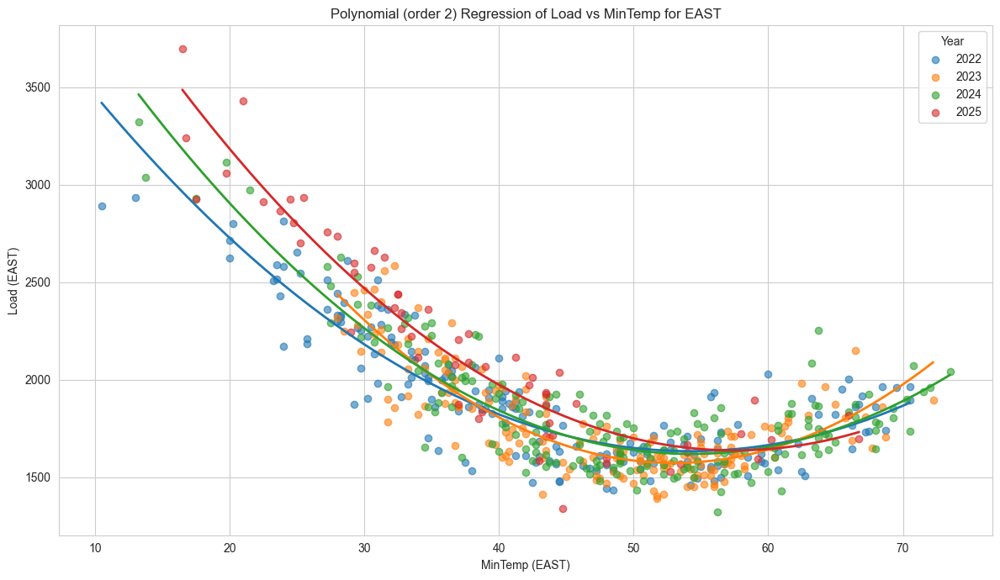

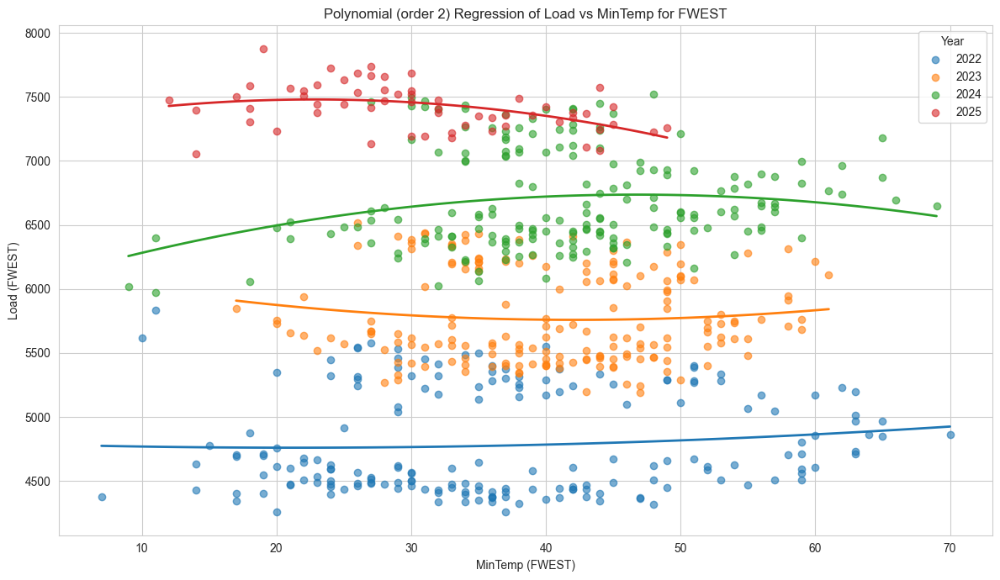

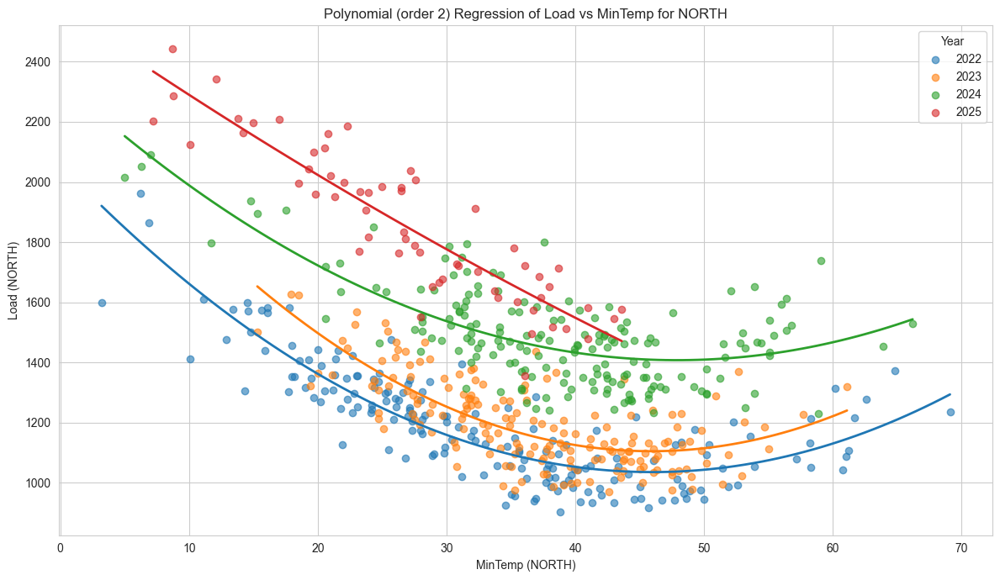

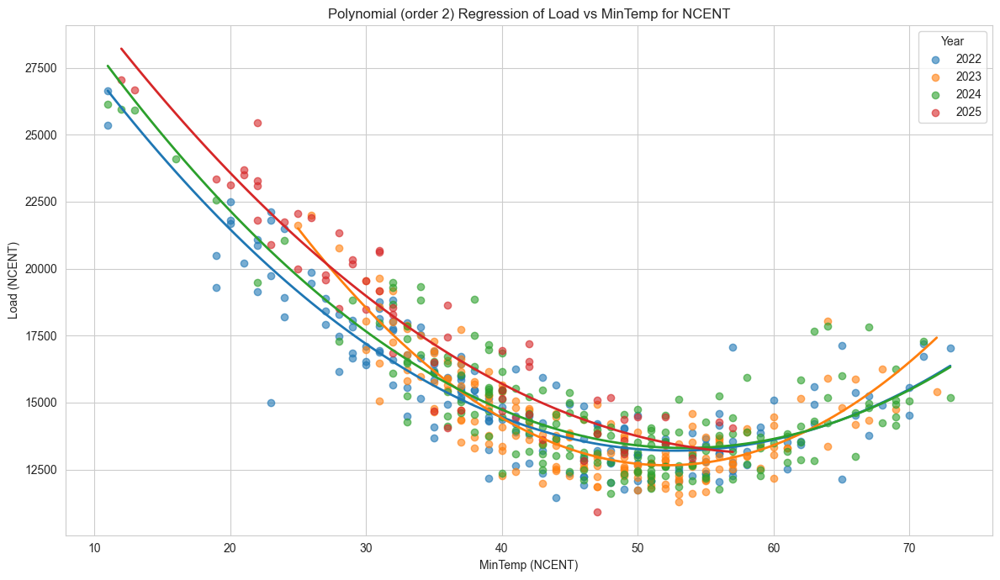

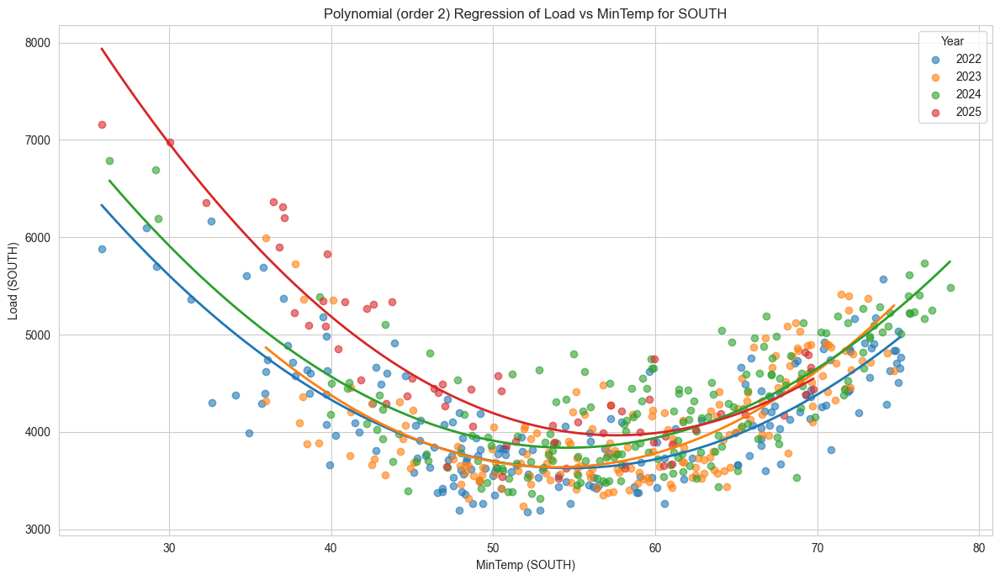

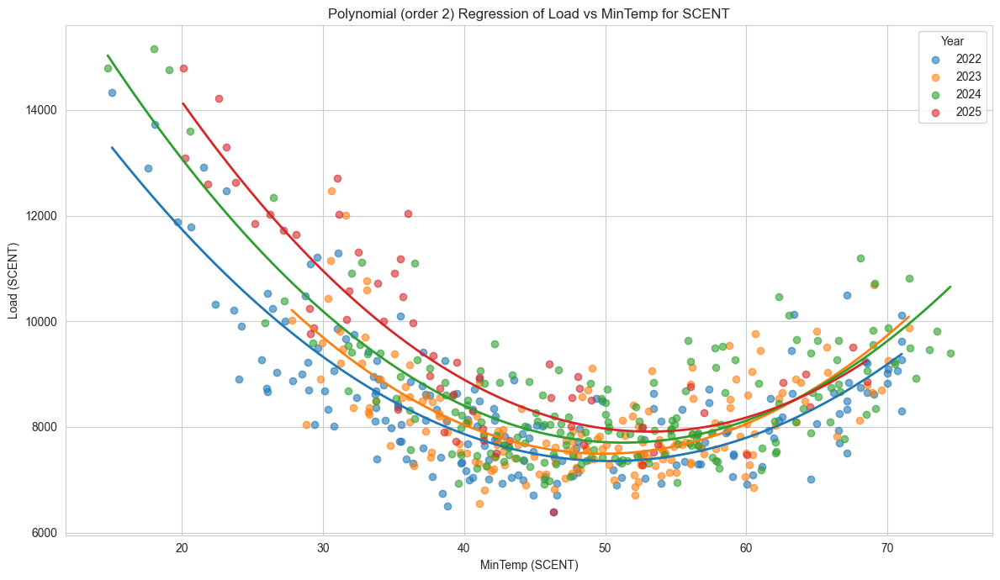

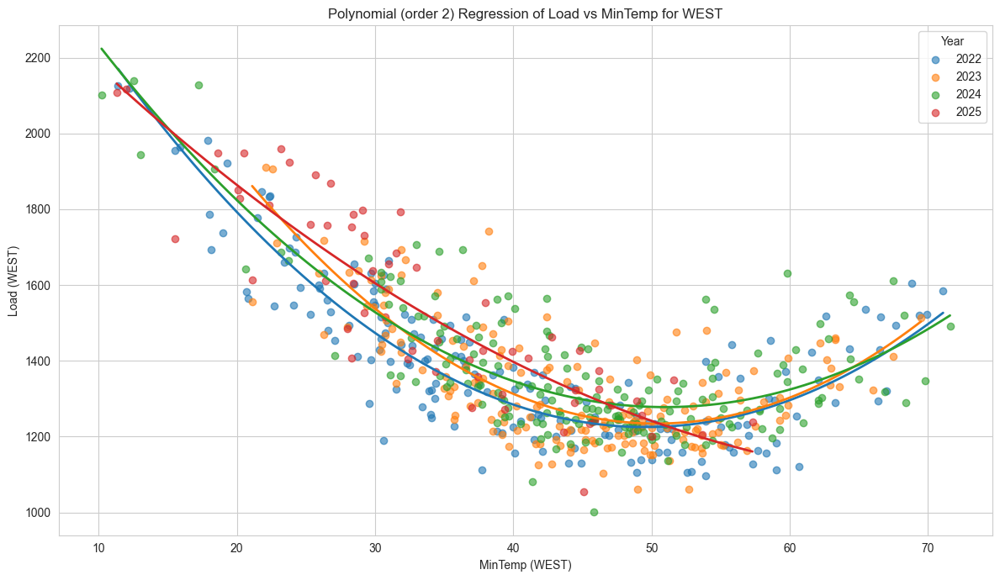

In [16]:
# Example usage:
plot_load_vs_weather(combined_df, 'ERCOT', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'COAST', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'EAST', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'FWEST', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'NORTH', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'NCENT', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'SOUTH', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'SCENT', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])
plot_load_vs_weather(combined_df, 'WEST', 'MinTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,11,12])

In [1]:
import requests
import pandas as pd

def fetch_all_data():
    base_url = "https://api.eia.gov/v2/electricity/rto/daily-fuel-type-data/data/"
    api_key = "QPB6iXLFXYLNVdz2nhVAqFnbD6dVQjb5vNSKTANC"
    
    params = {
        "frequency": "daily",
        "data[0]": "value",
        # Note: Some fueltype values are repeated as provided.
        "facets[fueltype][]": [
            "BAT", "BAT", "COL", "GEO", "NG", "NUC", "OES", "OIL", "OTH",
            "PS", "PS", "SNB", "SNB", "SUN", "UES", "UES", "UNK", "WAT", "WNB", "WND"
        ],
        "facets[respondent][]": ["ERCO"],
        "start": "2019-01-01",
        "end": "2025-03-20",
        "sort[0][column]": "period",
        "sort[0][direction]": "desc",
        "offset": 0,
        "length": 5000,
        "api_key": api_key
    }
    
    # Initial API call
    response = requests.get(base_url, params=params)
    response.raise_for_status()
    json_data = response.json()
    
    total = int(json_data["response"]["total"])
    all_data = json_data["response"]["data"]
    print(f"Total rows to fetch: {total}")
    
    # Paginate if needed
    offset = 5000
    while offset < total:
        print(f"Fetching offset: {offset}")
        params["offset"] = offset
        response = requests.get(base_url, params=params)
        response.raise_for_status()
        page_data = response.json()["response"]["data"]
        if not page_data:
            break
        all_data.extend(page_data)
        offset += 5000
        
    return all_data

# Fetch data and load into DataFrame
data = fetch_all_data()
df = pd.DataFrame(data)

# Convert 'period' to datetime and 'value' to numeric
df['period'] = pd.to_datetime(df['period'], errors='coerce')
df['value'] = pd.to_numeric(df['value'], errors='coerce')

# Pivot the DataFrame so that each row is a single day (period)
# and each fueltype becomes its own column.
# In case of duplicates, we use the first value.
pivot_df = df.pivot_table(index='period', columns='fueltype', values='value', aggfunc='first')

# Reset index so that period becomes a column, and rename it to 'DATE' if desired.
pivot_df = pivot_df.reset_index().rename(columns={'period': 'DATE'})

# Display a sample of the pivoted DataFrame
print(pivot_df.head())

# Optionally, save the pivoted data to a CSV file
pivot_df


Total rows to fetch: 80797
Fetching offset: 5000
Fetching offset: 10000
Fetching offset: 15000
Fetching offset: 20000
Fetching offset: 25000
Fetching offset: 30000
Fetching offset: 35000
Fetching offset: 40000
Fetching offset: 45000
Fetching offset: 50000
Fetching offset: 55000
Fetching offset: 60000
Fetching offset: 65000
Fetching offset: 70000
Fetching offset: 75000
Fetching offset: 80000
fueltype       DATE  BAT       COL        NG      NUC    OTH     SUN  UES  \
0        2019-01-01  NaN  240843.0  484468.0  93947.0  378.0  1179.0  NaN   
1        2019-01-02  NaN  278476.0  712945.0  93930.0  368.0   964.0  NaN   
2        2019-01-03  NaN  244315.0  632081.0  93977.0  380.0  8931.0  NaN   
3        2019-01-04  NaN  198854.0  586595.0  93944.0  421.0  9937.0  NaN   
4        2019-01-05  NaN  185595.0  419288.0  93862.0  423.0  8928.0  NaN   

fueltype     WAT       WND  
0         4470.0  163589.0  
1         5480.0   43542.0  
2         6347.0  119202.0  
3         6215.0  115199.0 

fueltype,DATE,BAT,COL,NG,NUC,OTH,SUN,UES,WAT,WND
0,2019-01-01,NaN,240843.0,484468.0,93947.0,378.0,1179.0,NaN,4470.0,163589.0
1,2019-01-02,NaN,278476.0,712945.0,93930.0,368.0,964.0,NaN,5480.0,43542.0
2,2019-01-03,NaN,244315.0,632081.0,93977.0,380.0,8931.0,NaN,6347.0,119202.0
3,2019-01-04,NaN,198854.0,586595.0,93944.0,421.0,9937.0,NaN,6215.0,115199.0
4,2019-01-05,NaN,185595.0,419288.0,93862.0,423.0,8928.0,NaN,6074.0,186672.0
...,...,...,...,...,...,...,...,...,...,...
2266,2025-03-16,12980.0,134714.0,339008.0,122187.0,57.0,221265.0,-17258.0,1053.0,213295.0
2267,2025-03-17,11871.0,122168.0,183560.0,122077.0,41.0,149124.0,-16245.0,448.0,545465.0
2268,2025-03-18,12221.0,134104.0,175560.0,122058.0,81.0,145111.0,-13486.0,410.0,568384.0
2269,2025-03-19,10402.0,129520.0,232830.0,122076.0,156.0,139659.0,-19313.0,1123.0,490042.0


In [2]:
import pandas as pd

# Ensure the pivoted DataFrame has no index/column name (drop "fueltype" if present)
pivot_df.index.name = None
pivot_df.columns.name = None

# Identify the fuel type columns (all columns except 'DATE')
fuel_cols = pivot_df.columns.drop('DATE')

# Compute total generation per row using the fuel type columns
pivot_df['TOTAL_GEN'] = pivot_df[fuel_cols].sum(axis=1)

# For each fuel type, create a new column showing its percentage of total generation
for col in fuel_cols:
    new_col = f"{col}RATIO"
    pivot_df[new_col] = (pivot_df[col] / pivot_df['TOTAL_GEN']) * 100

# Optionally, drop the temporary TOTAL_GEN column if not needed
pivot_df = pivot_df.drop(columns='TOTAL_GEN')

# Display the updated DataFrame
pivot_df


,DATE,BAT,COL,NG,NUC,OTH,SUN,UES,WAT,WND,BATRATIO,COLRATIO,NGRATIO,NUCRATIO,OTHRATIO,SUNRATIO,UESRATIO,WATRATIO,WNDRATIO
0,2019-01-01,NaN,240843.0,484468.0,93947.0,378.0,1179.0,NaN,4470.0,163589.0,NaN,24.355277,48.991884,9.500401,0.038225,0.119227,NaN,0.452029,16.542957
1,2019-01-02,NaN,278476.0,712945.0,93930.0,368.0,964.0,NaN,5480.0,43542.0,NaN,24.520100,62.775545,8.270634,0.032403,0.084881,NaN,0.482520,3.833918
2,2019-01-03,NaN,244315.0,632081.0,93977.0,380.0,8931.0,NaN,6347.0,119202.0,NaN,22.105294,57.189841,8.502913,0.034382,0.808065,NaN,0.574268,10.785237
3,2019-01-04,NaN,198854.0,586595.0,93944.0,421.0,9937.0,NaN,6215.0,115199.0,NaN,19.665831,58.011798,9.290670,0.041635,0.982728,NaN,0.614638,11.392700
4,2019-01-05,NaN,185595.0,419288.0,93862.0,423.0,8928.0,NaN,6074.0,186672.0,NaN,20.602392,46.544011,10.419363,0.046956,0.991073,NaN,0.674258,20.721947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2266,2025-03-16,12980.0,134714.0,339008.0,122187.0,57.0,221265.0,-17258.0,1053.0,213295.0,1.263505,13.113391,32.999871,11.893982,0.005549,21.538478,-1.679936,0.102502,20.762659
2267,2025-03-17,11871.0,122168.0,183560.0,122077.0,41.0,149124.0,-16245.0,448.0,545465.0,1.061324,10.922398,16.411133,10.914262,0.003666,13.332392,-1.452380,0.040053,48.767153
2268,2025-03-18,12221.0,134104.0,175560.0,122058.0,81.0,145111.0,-13486.0,410.0,568384.0,1.067856,11.717840,15.340214,10.665276,0.007078,12.679618,-1.178390,0.035825,49.664684
2269,2025-03-19,10402.0,129520.0,232830.0,122076.0,156.0,139659.0,-19313.0,1123.0,490042.0,0.940086,11.705430,21.042119,11.032675,0.014099,12.621747,-1.745421,0.101492,44.287774


In [14]:
import pandas as pd

# Ensure DATE columns are datetime
pivot_df['DATE'] = pd.to_datetime(pivot_df['DATE'])
stations['date'] = pd.to_datetime(stations['date'])

# Metrics to aggregate
metrics = ['MinTemp', 'MaxTemp', 'HDD', 'CDD', 'AvgTemp', 'TotalDD']

region_weights = {
    "BAT": ERCOT,
    "COL": ERCOT,
    "NG": ERCOT,
    "NUC": ERCOT,
    "OTH": ERCOT,
    "SUN": ERCOT,
    "UES": ERCOT,
    "WAT": ERCOT,
    "WND": ERCOT,
    "BATRATIO": ERCOT,
    "COLRATIO": ERCOT,
    "NGRATIO": ERCOT,
    "NUCRATIO": ERCOT,
    "OTHRATIO": ERCOT,
    "SUNRATIO": ERCOT,
    "UESRATIO": ERCOT,
    "WATRATIO": ERCOT,
    "WNDRATIO": ERCOT
}

combined_df_gen = pivot_df.copy()

# For each metric and region, compute the weighted average and map it into combined_df_gen
for metric in metrics:
    for region, weights in region_weights.items():
        # Extract relevant stations
        region_stations = stations[stations['station'].isin(weights.keys())]
        
        # Compute weighted average per day as a Series with 'date' as its index
        weighted_avg = (
            region_stations
            .assign(weight=region_stations['station'].map(weights))
            .groupby('date')
            .apply(lambda x: (x[metric] * x['weight']).sum() / x['weight'].sum())
        )
        
        # Map the computed weighted average to the daily_load DataFrame based on DATE
        combined_df_gen[f'{region}_{metric}'] = combined_df_gen['DATE'].map(weighted_avg)

# Display result
combined_df_gen

,DATE,BAT,COL,NG,NUC,OTH,SUN,UES,WAT,WND,...,WND_TotalDD,BATRATIO_TotalDD,COLRATIO_TotalDD,NGRATIO_TotalDD,NUCRATIO_TotalDD,OTHRATIO_TotalDD,SUNRATIO_TotalDD,UESRATIO_TotalDD,WATRATIO_TotalDD,WNDRATIO_TotalDD
0,2019-01-01,NaN,240843.0,484468.0,93947.0,378.0,1179.0,NaN,4470.0,163589.0,...,18.84,18.84,18.84,18.84,18.84,18.84,18.84,18.84,18.84,18.84
1,2019-01-02,NaN,278476.0,712945.0,93930.0,368.0,964.0,NaN,5480.0,43542.0,...,21.68,21.68,21.68,21.68,21.68,21.68,21.68,21.68,21.68,21.68
2,2019-01-03,NaN,244315.0,632081.0,93977.0,380.0,8931.0,NaN,6347.0,119202.0,...,21.25,21.25,21.25,21.25,21.25,21.25,21.25,21.25,21.25,21.25
3,2019-01-04,NaN,198854.0,586595.0,93944.0,421.0,9937.0,NaN,6215.0,115199.0,...,15.36,15.36,15.36,15.36,15.36,15.36,15.36,15.36,15.36,15.36
4,2019-01-05,NaN,185595.0,419288.0,93862.0,423.0,8928.0,NaN,6074.0,186672.0,...,11.39,11.39,11.39,11.39,11.39,11.39,11.39,11.39,11.39,11.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2266,2025-03-16,12980.0,134714.0,339008.0,122187.0,57.0,221265.0,-17258.0,1053.0,213295.0,...,5.01,5.01,5.01,5.01,5.01,5.01,5.01,5.01,5.01,5.01
2267,2025-03-17,11871.0,122168.0,183560.0,122077.0,41.0,149124.0,-16245.0,448.0,545465.0,...,1.67,1.67,1.67,1.67,1.67,1.67,1.67,1.67,1.67,1.67
2268,2025-03-18,12221.0,134104.0,175560.0,122058.0,81.0,145111.0,-13486.0,410.0,568384.0,...,6.23,6.23,6.23,6.23,6.23,6.23,6.23,6.23,6.23,6.23
2269,2025-03-19,10402.0,129520.0,232830.0,122076.0,156.0,139659.0,-19313.0,1123.0,490042.0,...,5.11,5.11,5.11,5.11,5.11,5.11,5.11,5.11,5.11,5.11


Natural gas winter daily total winter gen vs avg temp


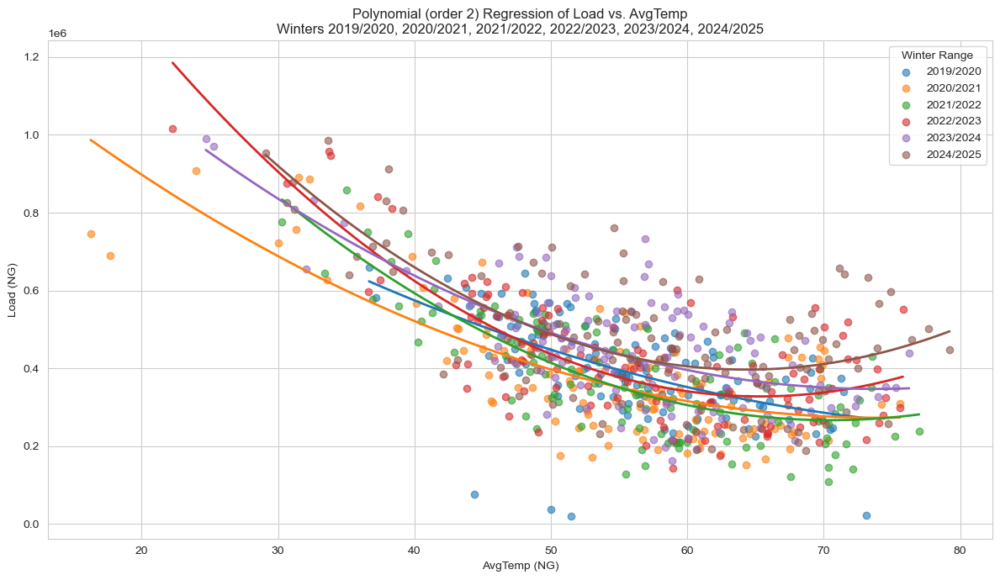

In [15]:
print("Natural gas winter daily total winter gen vs avg temp")
plot_load_vs_weather_winter(
    df=combined_df_gen,
    winters=["2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"],
    target_region="NG",
    target_variable="AvgTemp",
    polynomial_order=2
)

Natural gas winter daily total winter gen vs avg temp with growth YoY


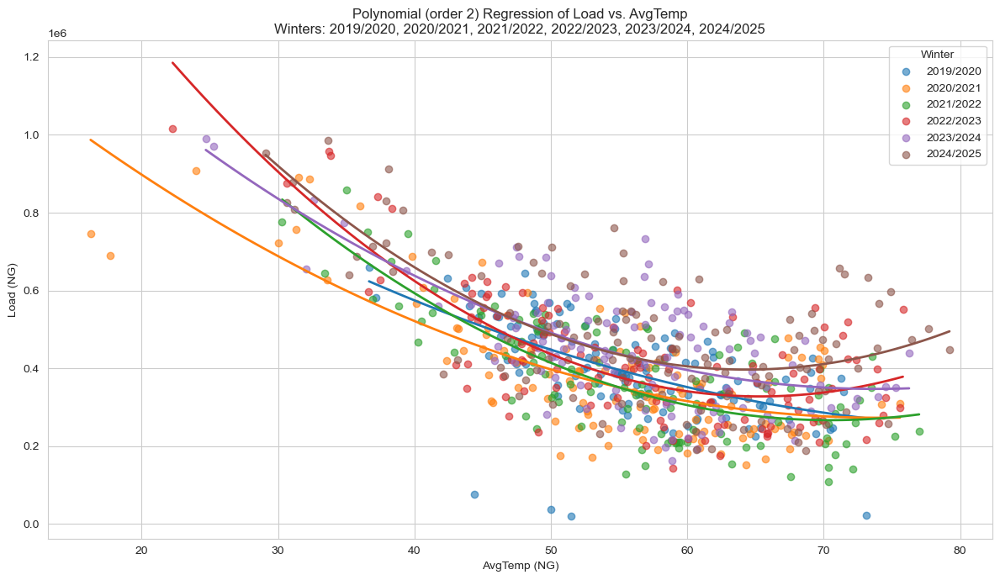

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2019/2020,2.010643e+07,NaN,NaN
1,2020/2021,1.839906e+07,-1.707364e+06,-8.491634
2,2021/2022,1.978565e+07,1.386590e+06,7.536198
3,2022/2023,2.169207e+07,1.906419e+06,9.635363
4,2023/2024,2.275546e+07,1.063387e+06,4.902190
5,2024/2025,2.402643e+07,1.270976e+06,5.585368


Natural gas winter daily total winter gen as percentage of total  vs avg temp with growth YoY


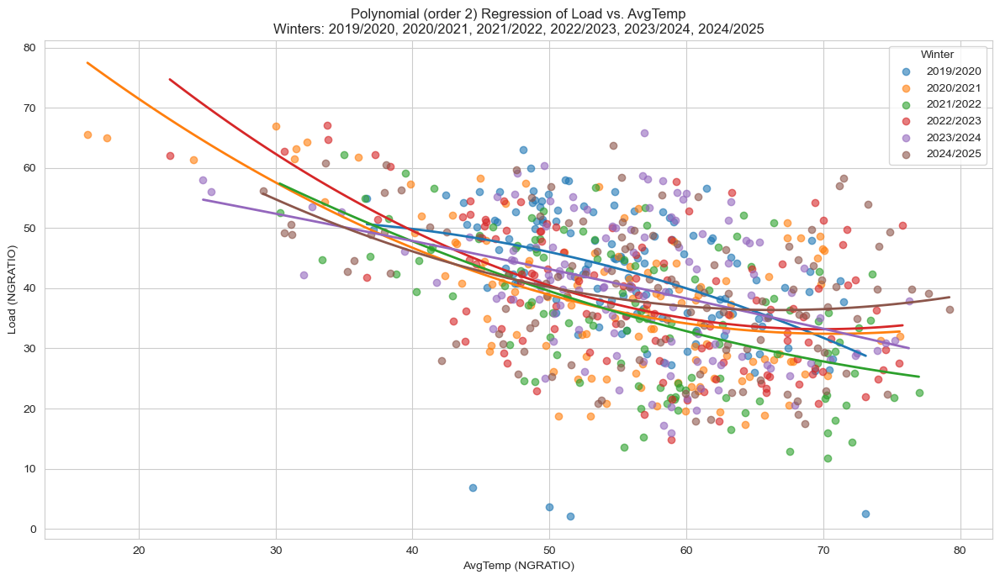

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2019/2020,1929.035605,NaN,NaN
1,2020/2021,1800.441724,-128.593882,-6.666226
2,2021/2022,1758.619128,-41.822595,-2.322907
3,2022/2023,1881.991743,123.372615,7.015312
4,2023/2024,1882.129582,0.137839,0.007324
5,2024/2025,1864.920856,-17.208726,-0.914322


In [16]:
print("Natural gas winter daily total winter gen vs avg temp with growth YoY")
results_df = integrated_load_vs_weather_winter(
        df=combined_df_gen,
        winters=["2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"],
        target_region="NG",
        target_variable="AvgTemp",
        polynomial_order=2,
        temp_min=30,
        temp_max=75
    )
display(results_df)

# appears to stronger geowth in gas gen with extreme colder and warmer winter temps but softer in mid temp range

print("Natural gas winter daily total winter gen as percentage of total  vs avg temp with growth YoY")
results_df = integrated_load_vs_weather_winter(
        df=combined_df_gen,
        winters=["2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"],
        target_region="NGRATIO",
        target_variable="AvgTemp",
        polynomial_order=2,
        temp_min=30,
        temp_max=75
    )
display(results_df)

Solar winter daily total winter gen vs avg temp with growth YoY


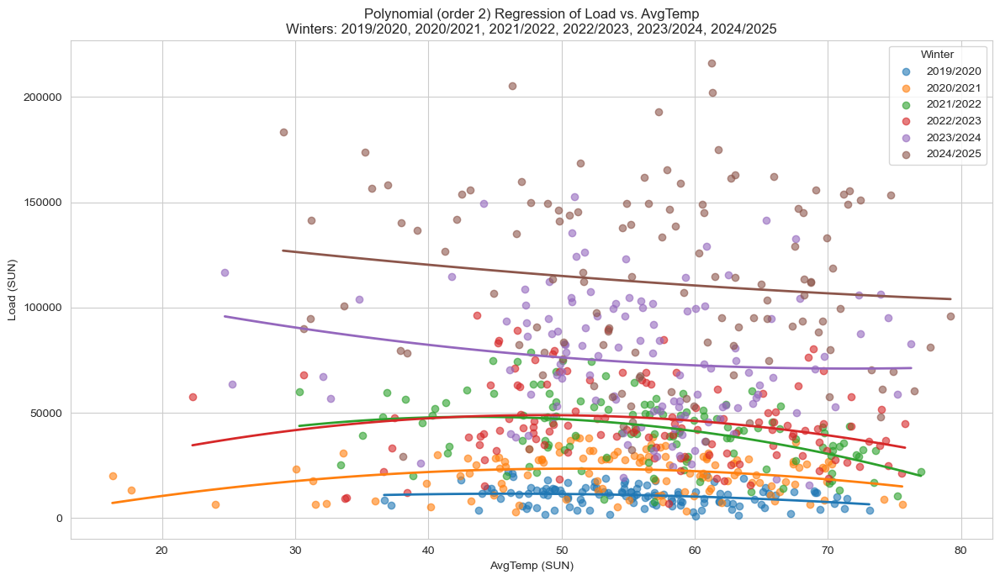

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2019/2020,4.557167e+05,NaN,NaN
1,2020/2021,9.502520e+05,4.945354e+05,108.518162
2,2021/2022,1.883171e+06,9.329190e+05,98.175954
3,2022/2023,2.027789e+06,1.446181e+05,7.679498
4,2023/2024,3.466750e+06,1.438961e+06,70.962064
5,2024/2025,5.150801e+06,1.684050e+06,48.577207


Solar winter daily total winter gen as percentage of total  vs avg temp with growth YoY


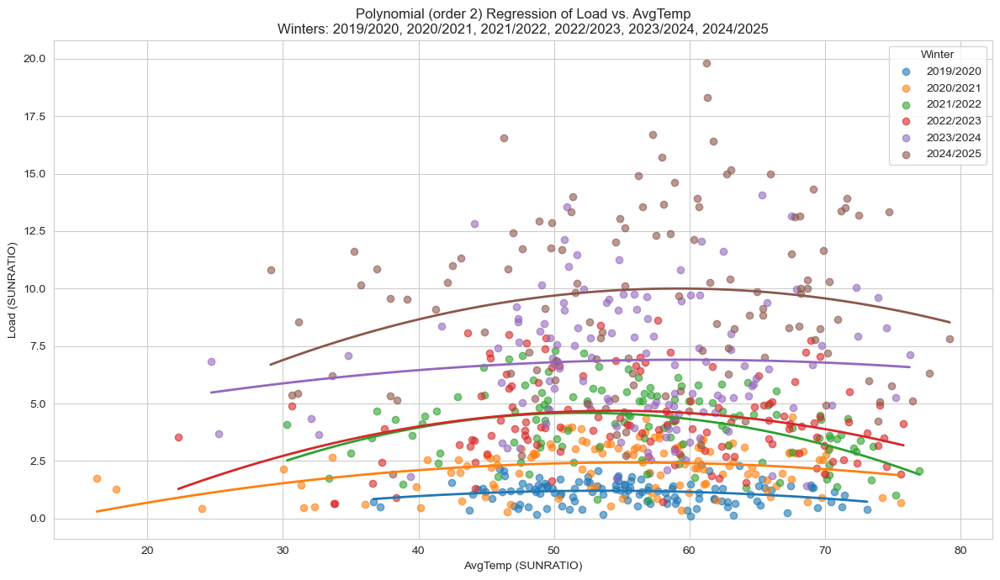

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2019/2020,44.709340,NaN,NaN
1,2020/2021,98.539290,53.829950,120.399786
2,2021/2022,173.704449,75.165159,76.279380
3,2022/2023,185.369522,11.665073,6.715472
4,2023/2024,299.198858,113.829337,61.406717
5,2024/2025,415.046735,115.847877,38.719358


In [17]:
print("Solar winter daily total winter gen vs avg temp with growth YoY")
results_df = integrated_load_vs_weather_winter(
        df=combined_df_gen,
        winters=["2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"],
        target_region="SUN",
        target_variable="AvgTemp",
        polynomial_order=2,
        temp_min=30,
        temp_max=75
    )
display(results_df)

# appears to stronger geowth in gas gen with extreme colder and warmer winter temps but softer in mid temp range

print("Solar winter daily total winter gen as percentage of total  vs avg temp with growth YoY")
results_df = integrated_load_vs_weather_winter(
        df=combined_df_gen,
        winters=["2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"],
        target_region="SUNRATIO",
        target_variable="AvgTemp",
        polynomial_order=2,
        temp_min=30,
        temp_max=75
    )
display(results_df)

Wind winter daily total winter gen vs avg temp with growth YoY


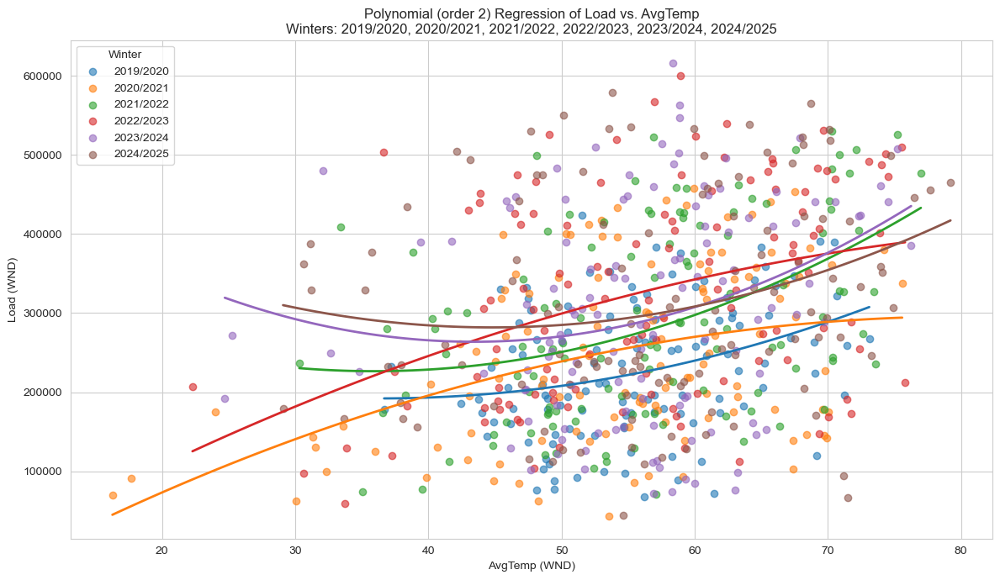

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2019/2020,1.029704e+07,NaN,NaN
1,2020/2021,1.069320e+07,3.961611e+05,3.847330
2,2021/2022,1.264003e+07,1.946827e+06,18.206211
3,2022/2023,1.360738e+07,9.673531e+05,7.653092
4,2023/2024,1.366860e+07,6.121320e+04,0.449853
5,2024/2025,1.385813e+07,1.895385e+05,1.386672


Wind winter daily total winter gen as percentage of total  vs avg temp with growth YoY


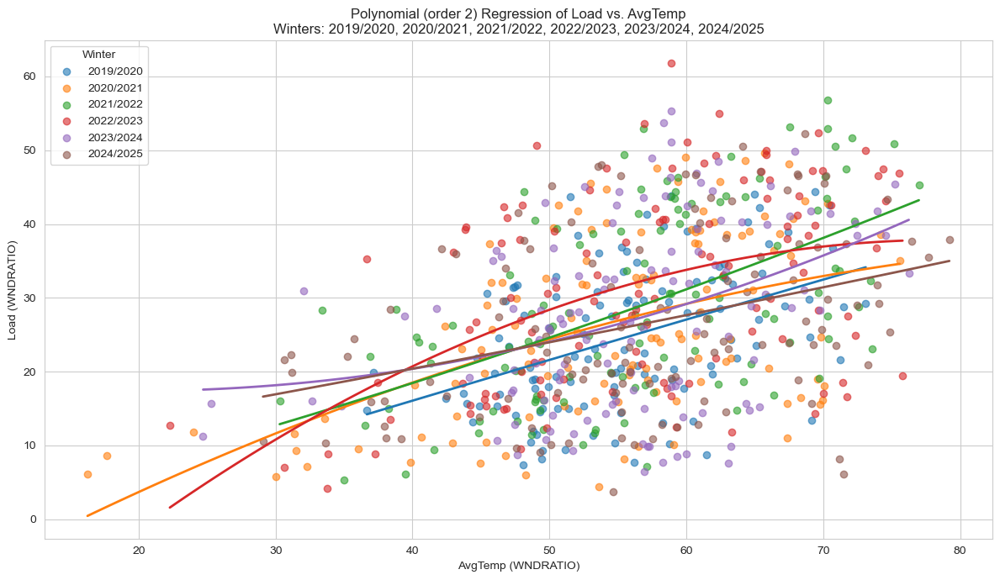

,Winter,IntegratedValue,YoY_AbsChange,YoY_PctChange
0,2019/2020,1031.276409,NaN,NaN
1,2020/2021,1115.796595,84.520186,8.195687
2,2021/2022,1194.636614,78.840018,7.065806
3,2022/2023,1261.997996,67.361382,5.638650
4,2023/2024,1188.788939,-73.209057,-5.801044
5,2024/2025,1123.908382,-64.880558,-5.457702


In [18]:
print("Wind winter daily total winter gen vs avg temp with growth YoY")
results_df = integrated_load_vs_weather_winter(
        df=combined_df_gen,
        winters=["2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"],
        target_region="WND",
        target_variable="AvgTemp",
        polynomial_order=2,
        temp_min=30,
        temp_max=75
    )
display(results_df)

# appears to stronger geowth in gas gen with extreme colder and warmer winter temps but softer in mid temp range

print("Wind winter daily total winter gen as percentage of total  vs avg temp with growth YoY")
results_df = integrated_load_vs_weather_winter(
        df=combined_df_gen,
        winters=["2019/2020", "2020/2021", "2021/2022", "2022/2023", "2023/2024", "2024/2025"],
        target_region="WNDRATIO",
        target_variable="AvgTemp",
        polynomial_order=2,
        temp_min=30,
        temp_max=75
    )
display(results_df)

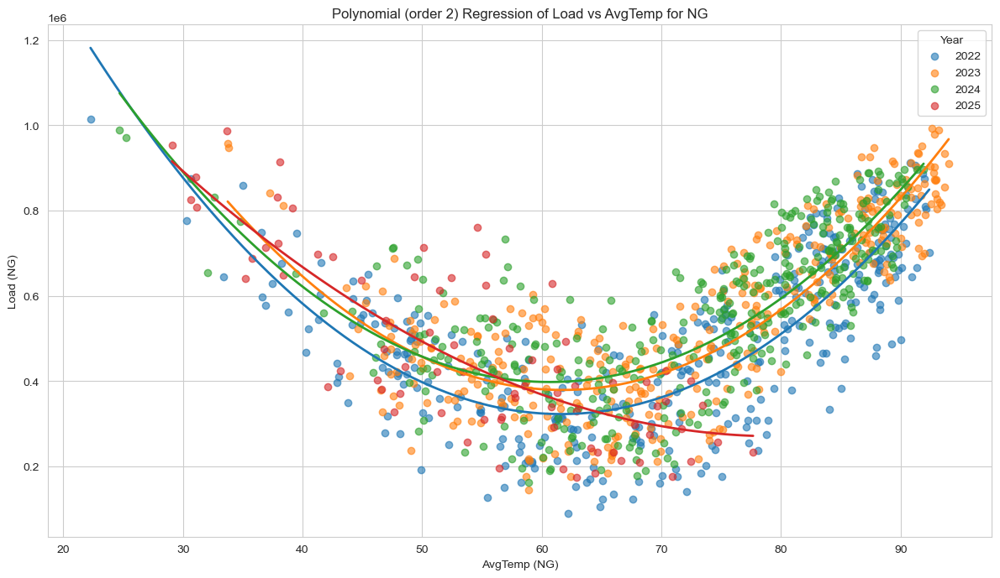

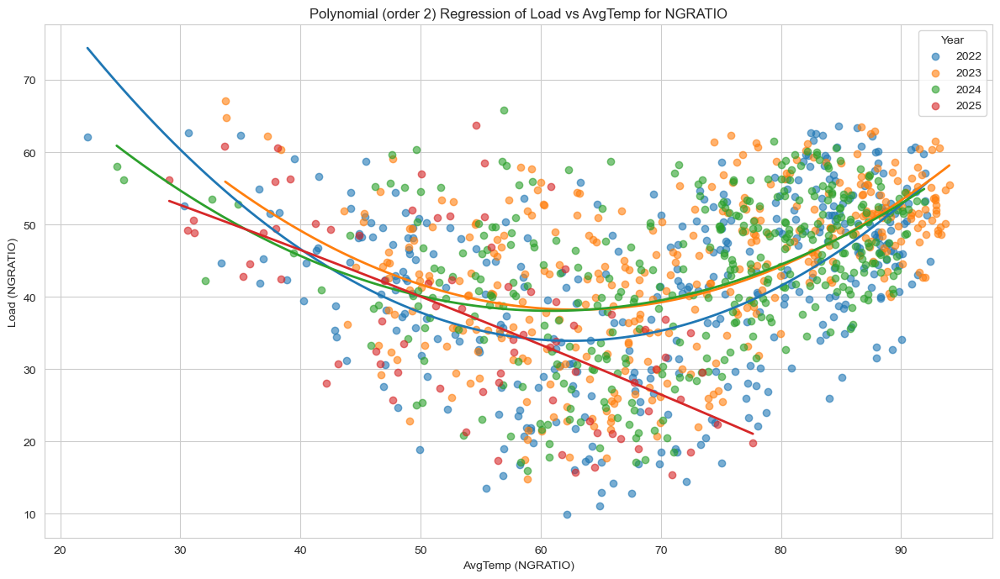

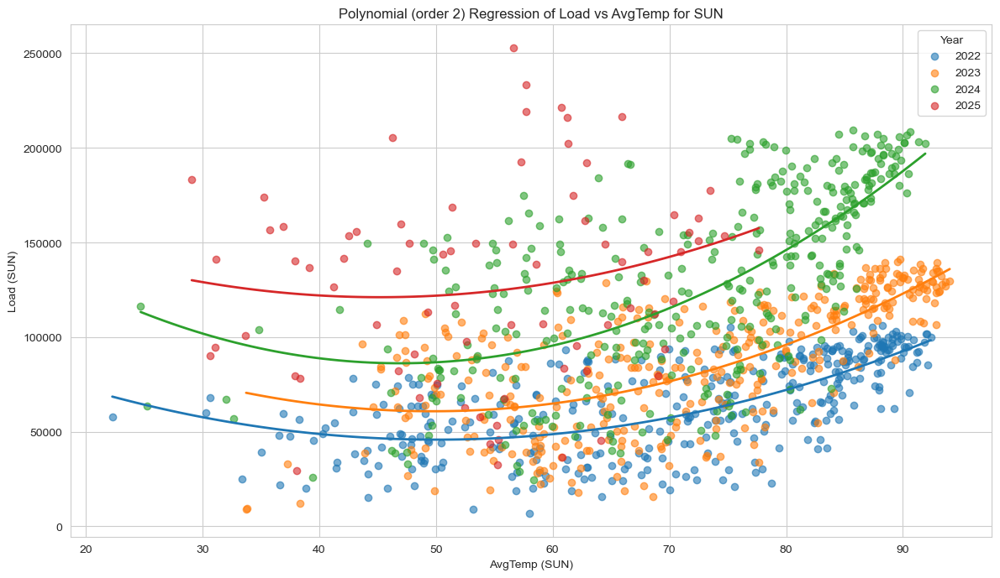

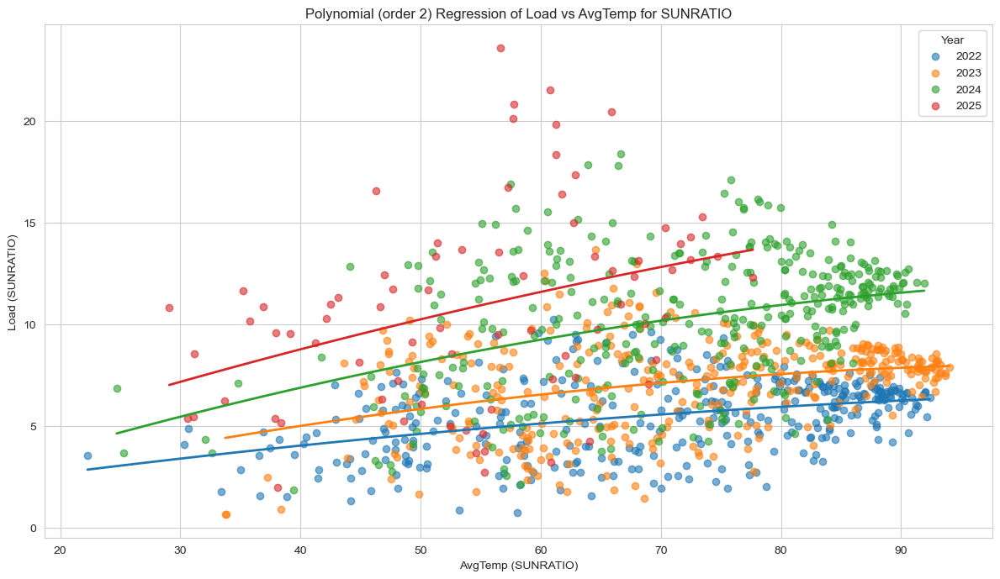

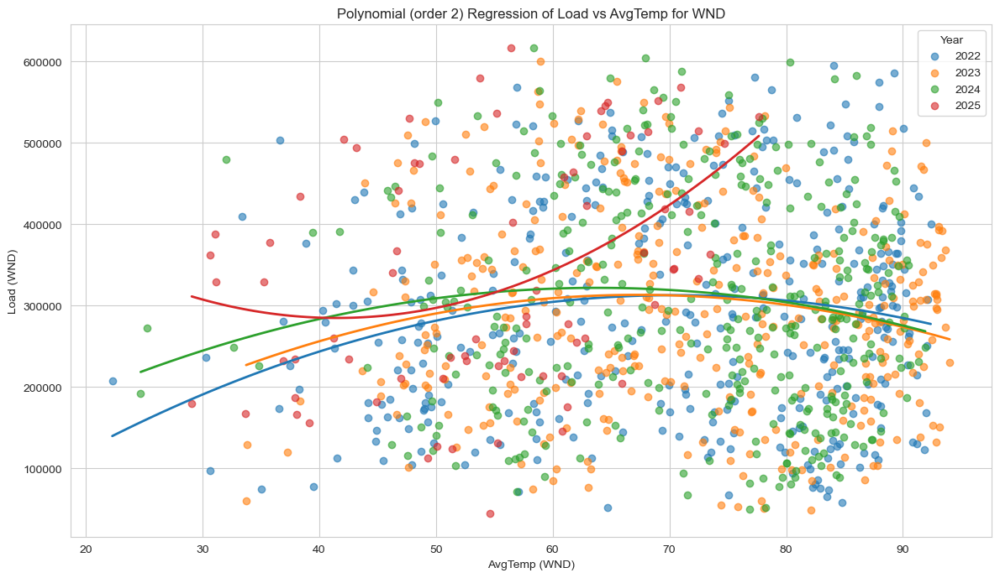

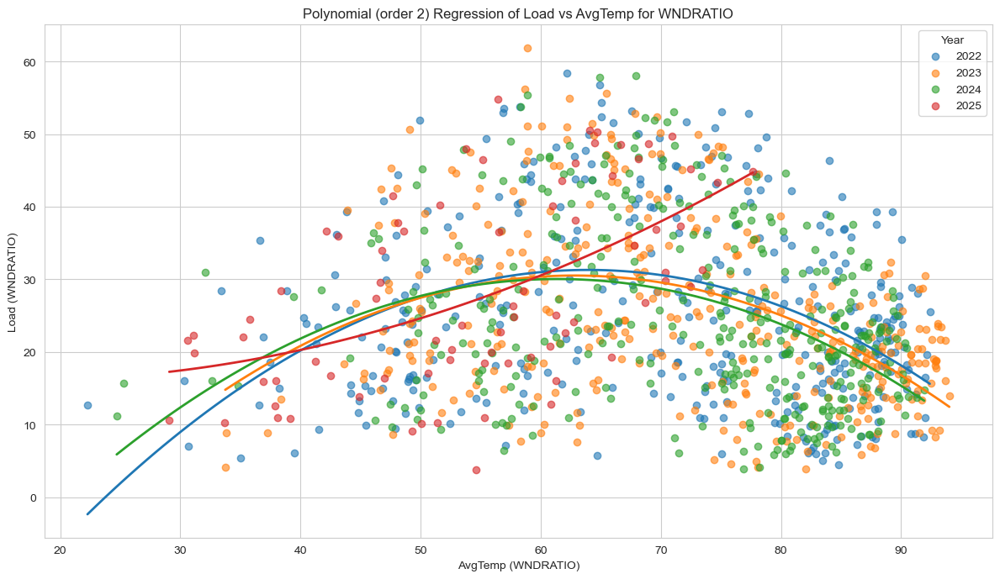

In [22]:
regions = [
    "NG", "NGRATIO", "SUN", "SUNRATIO", "WND", "WNDRATIO",
]

# Example usage:
# plot_load_vs_weather(combined_df, 'PJM_TOTAL', 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])

for region in regions:
    plot_load_vs_weather(combined_df_gen, region, 'AvgTemp', polynomial_order=2, years=[2022,2023,2024,2025], months=[1,2,3,4,5,6,7,8,9,10,11,12])